# Thera Bank - Credit Card Customer Churn Prediction
## Summary
Thera Bank is concerned about a recent decline in the number of credit card users they have in their customer base. Retaining customers who have a credit card is important for the banks revenue. Therefore, the bank is interested in a predictive model that could assess whether a customer who does have a credit card is lokely to churn or not.

#### Purpose: Thera Bank wants a predictive classification model that can predict which customers are more likely to churn or not and to better understand what factors may lead a customer to churn from having a credit card with the bank.

### Objectives:
- Explore the dataset for possible reasons that could be related to customers churning or not
- Build a classification model that predicts if the customer a given customer will churn or not
- Optimize the model
- Give final conclusions and insights on what may be leading to the churn the bank is seeing in their customer base

## Data Dictionary
1. CLIENTNUM: Client number (unique identifier)
2. Attrition_Flag: "Attrited Customer": account is closed, "Existing Customer": still retains an account. **This is the target variable.**
3. Customer_Age: Age in years.
4. Gender: Gender of the account holder
5. Dependent_count: Number of dependents
6. Education_Level: Includes: Graduate, High School, Unkown, Uneducated, College (as in is a college student), Post-Graduate, Doctorate
7. Maritial_Status: Maritial Status of account holder
8. Income_Category: Annual Income Category of the account holder
9. Card_Category: Type of card
10. Months_on_book: Period of relationship with bank
11. Total_Relationship_Count: Total no. of products held by the customer
12. Months_Inactive_12_mon: No. of months inactive in the last 12 months
13. Contacts_Count_12_mon: No. of Contacts between customer and bank in the last 12 months
14. Credit_Limit: Credit Limit on the CC
15. Total_Revolving_Bal: Balance that carries over from one month to the next
16. Avg_Open_To_Buy: Open to Buy refers to the amount left on the credit card to use (Average of last 12 months)
17. Total_Trans_Amt: Total Transaction Amount (Last 12 Months)
18. Total_Trans_Ct: Total Transaction Count (Last 12 Months)
19. Total_Ct_Chng_Q4_Q1: Ratio of the transaction count in 4th quarter and the total transaction count in the 1st quarter
20. Total_Amt_Chng_Q4_Q1: Ratio of the total transaction amount in the 4th quarter and the total transaction amount in the 1st quarter
21. Avg_Utilization_Ratio: How much of the available credit the customer spent

In [1]:
"""Packages imported for the analysis"""
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 200)

sns.set_style("darkgrid")

import scipy.stats as stats
import warnings
warnings.filterwarnings('ignore')
from beepy import beep

%matplotlib inline

# Modeling Packages
from sklearn import metrics
from sklearn.metrics import (
    f1_score, 
    accuracy_score, 
    recall_score, 
    precision_score, 
    confusion_matrix, 
    roc_auc_score, 
    plot_confusion_matrix
)
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import(
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier
)
from xgboost import XGBClassifier

from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import (
    GridSearchCV, 
    RandomizedSearchCV, 
    train_test_split,
    StratifiedKFold,
    cross_val_score
)

from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer


# Data Exploration & Data Cleaning

## Initial assessment of the data

In [2]:
"""Import dataset and format into a basic dataframe"""
data = pd.read_csv("BankChurners.csv")
raw_df = data.copy()
del data

In [3]:
"""Assessment of data type, organization, and Nans"""
print(f'Datset has {raw_df.shape[0]} rows and {raw_df.shape[1]} columns.') # Assess dataset shape
raw_df.isna().sum() # Number of Nans within each feature

Datset has 10127 rows and 21 columns.


CLIENTNUM                      0
Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

In [4]:
round(raw_df.isna().sum()[raw_df.isna().sum() > 0]/raw_df.shape[0] * 100, 2)

Education_Level    15.0
Marital_Status      7.4
dtype: float64

#### Notes
- Most features have no Nans
- **Education_Level** and **Marital_Status** are the notable exceptions. Especially as both have a significant percentage of Nans with **15% of the Education_Level data missing** and **7.4% of the Maritial_Status data missing.** Both are potentially significant holes by percentage, particularly the Education_Level hole, we will have to be cautious when dealing with those Nans.

In [5]:
raw_df.info() # Datatypes and counts (info) for the dataframe

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [6]:
"""Split data based on numerical and non-numerical for initial 
assessment of how types may need to be treated"""
num_cols = pd.Series(raw_df.select_dtypes(include=np.number).columns)
cat_cols = pd.Series(raw_df.select_dtypes(exclude=np.number).columns)

print(f"The numerical data is: \n{num_cols}")
print('*'*50)
print(f"The categorical data is: \n{cat_cols}")

The numerical data is: 
0                    CLIENTNUM
1                 Customer_Age
2              Dependent_count
3               Months_on_book
4     Total_Relationship_Count
5       Months_Inactive_12_mon
6        Contacts_Count_12_mon
7                 Credit_Limit
8          Total_Revolving_Bal
9              Avg_Open_To_Buy
10        Total_Amt_Chng_Q4_Q1
11             Total_Trans_Amt
12              Total_Trans_Ct
13         Total_Ct_Chng_Q4_Q1
14       Avg_Utilization_Ratio
dtype: object
**************************************************
The categorical data is: 
0     Attrition_Flag
1             Gender
2    Education_Level
3     Marital_Status
4    Income_Category
5      Card_Category
dtype: object


#### Notes
- CLIENTNUM is the unique identfier, as long as there are not duplicate should simply make it the index for easy compatability with bank database
- Nearly all numerical data follows logical assignment with regards to integers and floats. Numerical count variables are integers, while monetary columns are all floats. The exceptions would be **Total_Revolving_Bal and Total_Trans_Amt** which are likely a dollar amounts and are best represented as a float. In addition, **Total_Trans_Ct** should be an integer, but is a float as it would be count of number of transactions.
- Categorical data will need some work. First will need to check for duplicate or errors in entry before assigning the categorical type.
- **Atttrition_Flag** as the target variable should have a binary 0 or 1 column related to created for modeling purposes.

In [7]:
pd.options.display.float_format = "{:,.2f}".format # Set floats to show as currency (2 decimal points)
raw_df.sample(7) # Examine a sample of the actual data

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
4315,769684158,Existing Customer,42,M,4,College,Single,$40K - $60K,Blue,36,3,3,2,"2,502.00",1488,"1,014.00",0.56,3763,75,0.88,0.59
9734,716816583,Existing Customer,61,M,0,Graduate,Married,$60K - $80K,Blue,48,1,3,1,"15,483.00",2148,"13,335.00",0.74,14463,94,0.77,0.14
6264,718872858,Existing Customer,43,F,2,High School,Married,Less than $40K,Blue,36,5,1,3,"3,761.00",2121,"1,640.00",0.69,4476,79,0.93,0.56
9205,711465333,Existing Customer,35,M,4,High School,Single,$80K - $120K,Blue,26,2,1,1,"24,250.00",0,"24,250.00",0.75,12593,99,0.77,0.00
6089,818502708,Existing Customer,51,F,1,Uneducated,Single,$40K - $60K,Blue,46,5,3,2,"2,284.00",1674,610.00,0.78,4885,86,0.83,0.73
7391,713736333,Attrited Customer,41,F,3,Uneducated,Married,$40K - $60K,Blue,36,1,3,4,"3,606.00",0,"3,606.00",0.37,1829,41,0.52,0.00
4875,718924983,Existing Customer,59,M,0,Uneducated,Single,$60K - $80K,Blue,48,5,1,3,"4,906.00",1302,"3,604.00",0.86,4833,80,0.91,0.27


#### Notes:
- **Income_Category** will need to be adjusted. One for erroroneous entries, but also to solve formatting issues in the descriptions of the categories

In [8]:
# Check for duplicate rows and check on shape
print(f"There are {raw_df.duplicated().sum()} duplicate data entries.")

There are 0 duplicate data entries.


In [9]:
for i in num_cols:
    print(f"The number of unique values in {i} are: {raw_df[i].nunique()}")

The number of unique values in CLIENTNUM are: 10127
The number of unique values in Customer_Age are: 45
The number of unique values in Dependent_count are: 6
The number of unique values in Months_on_book are: 44
The number of unique values in Total_Relationship_Count are: 6
The number of unique values in Months_Inactive_12_mon are: 7
The number of unique values in Contacts_Count_12_mon are: 7
The number of unique values in Credit_Limit are: 6205
The number of unique values in Total_Revolving_Bal are: 1974
The number of unique values in Avg_Open_To_Buy are: 6813
The number of unique values in Total_Amt_Chng_Q4_Q1 are: 1158
The number of unique values in Total_Trans_Amt are: 5033
The number of unique values in Total_Trans_Ct are: 126
The number of unique values in Total_Ct_Chng_Q4_Q1 are: 830
The number of unique values in Avg_Utilization_Ratio are: 964


#### Notes
- CLIENTNUM is unique and should be set as the index

In [10]:
def hist_boxplot(df, feature, figsize=(12, 7), kde=False):
    """
    Boxplot and histogram plotted on same axes for easy comparison
    for a single variable.
    
    df: dataframe for data
    feature: column of interest
    figsize: size of figure
    kde: whether to plot the kde for the histogram
    bins: number of bins for the histogram
    """
    fig, (ax_box2, ax_hist2) = plt.subplots(nrows=2, sharex=True,
                                           gridspec_kw={'height_ratios': (0.25, 0.75)},
                                           figsize=figsize)
    sns.boxplot(data=df, x=feature, ax=ax_box2, showmeans=True)
    sns.histplot(data=df, x=feature, kde=kde, ax=ax_hist2)
    ax_hist2.axvline(df[feature].median(), color='black', linestyle='-')
    ax_hist2.axvline(df[feature].mean(), color='green', linestyle='--')

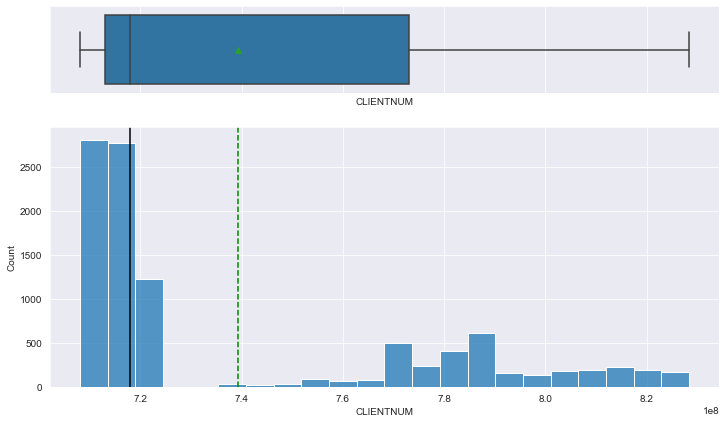

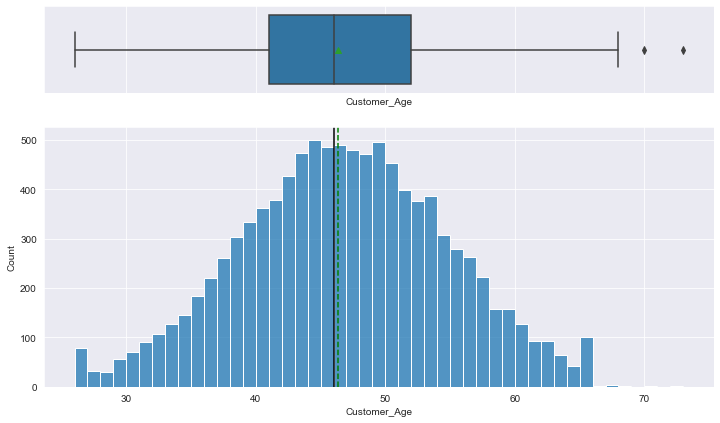

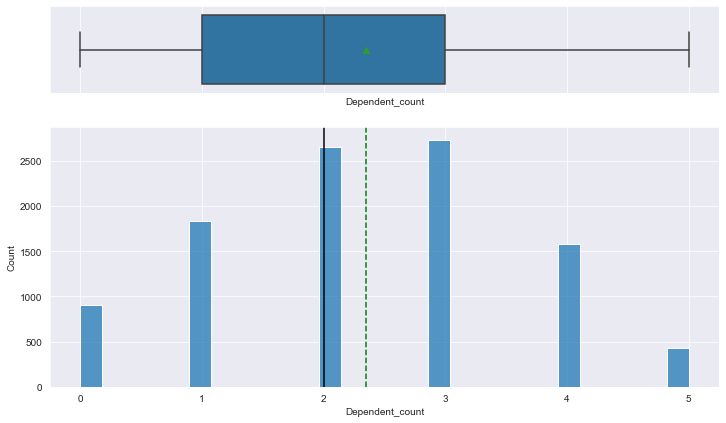

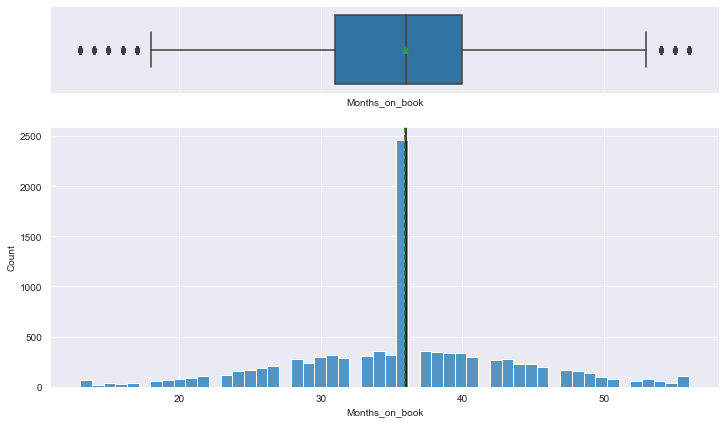

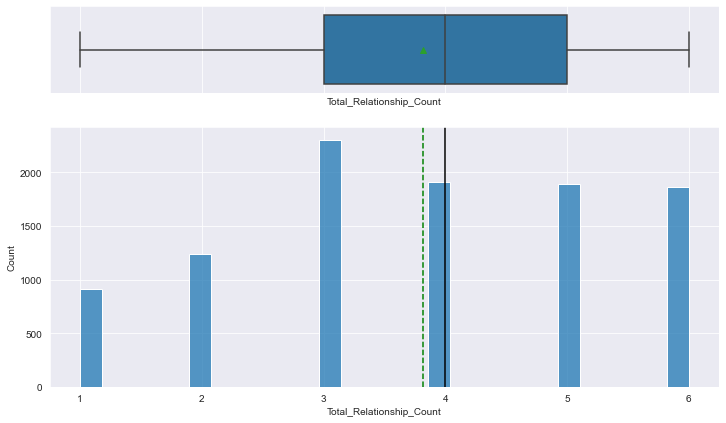

...

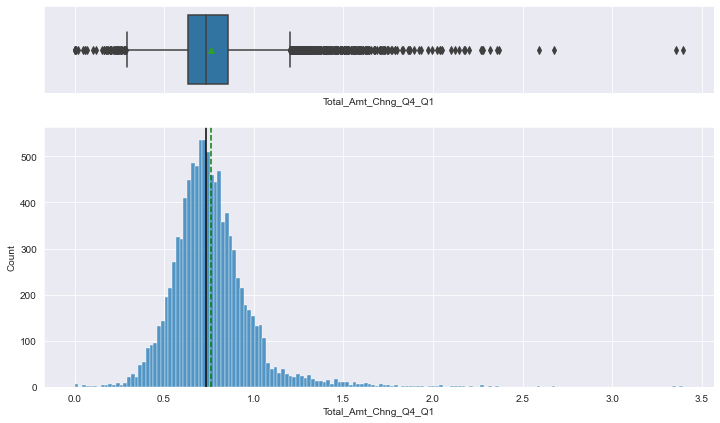

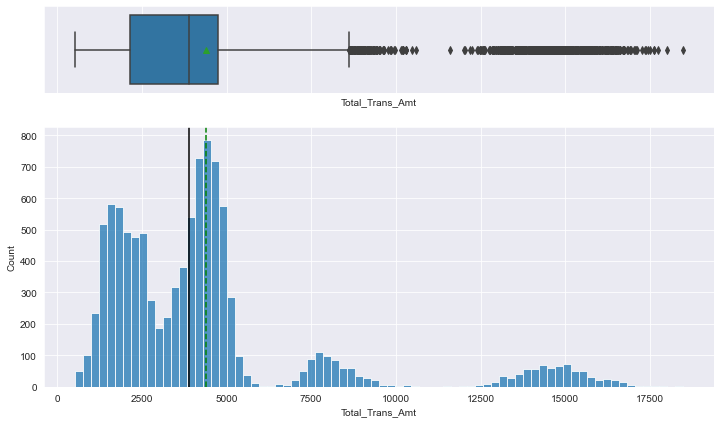

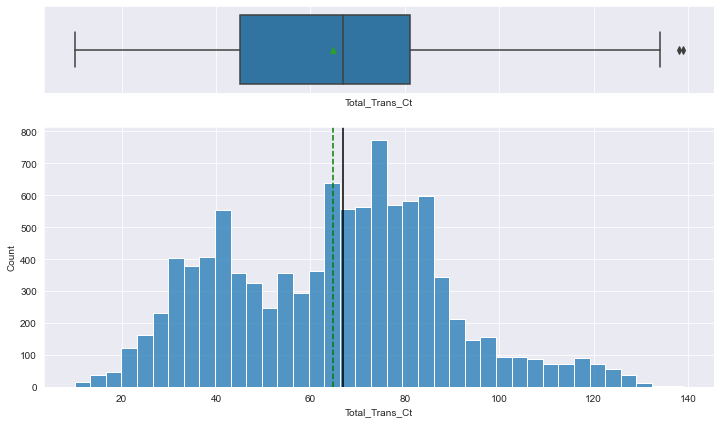

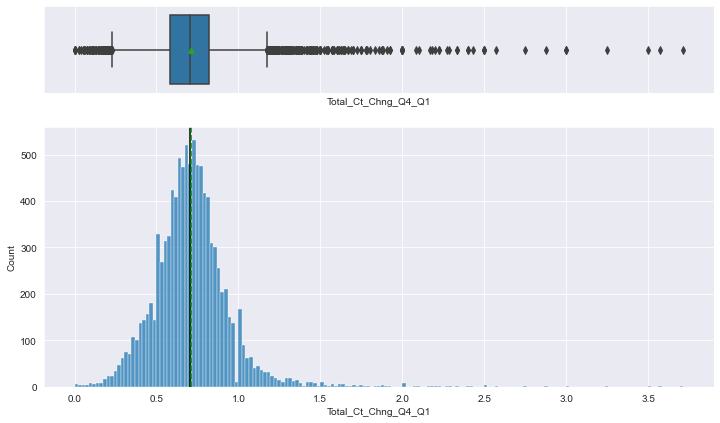

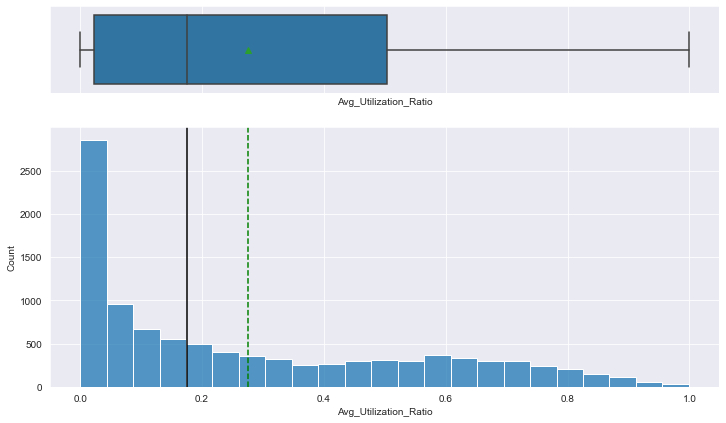

In [11]:
for i in range(len(num_cols)):
    hist_boxplot(raw_df, num_cols[i])

#### Notes
- **Age, Dependent_count, Months_on_book, Total_relationship_count, Months_Inactive, Contacts_count, Credit_limit, Avg_open_to_buy, Total_Amt_Chng, Total_Trans_Amt, Total_Trans_Ct** do not appear to have any major outliers that should be of concern.
- **Total_Revolving_Bal** has a high number of 0s, which is pottentially concerning. However, it would not be a surprising stat to have 0s on as it would simply suggest that a number of people completely pay off their monthly CC statement.
- There is an odd amount of capping within the data that appears present, and even some concentrations at the median. This is very apparent with regards to the median for **Months_on_book** Some of these metrics may have natural capping to them, such as **Credit_Limit**, for which the bank likely simply has a minimum and maxiumum credit limit they offer thereby creating a capping effect on the data. The oddball out is the massive spike at the median for **Months_on_book**, which does not appear to make sense unless there was some large merger or something else in that month that created the large median spike. Otherwise, someone has likely imputed a number of unknowns to the the median value.
- Regardless, even if outliers may have already been treated, there are no clear outliers that need to be treated in the numerical data.

In [12]:
raw_df[raw_df.Months_on_book == raw_df.Months_on_book.median()].describe(include='all')


,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,"2,463.00",2463,"2,463.00",2463,"2,463.00",2076,2271,2463,2463,"2,463.00","2,463.00","2,463.00","2,463.00","2,463.00","2,463.00","2,463.00","2,463.00","2,463.00","2,463.00","2,463.00","2,463.00"
unique,NaN,2,NaN,2,NaN,6,3,6,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,Existing Customer,NaN,F,NaN,Graduate,Married,Less than $40K,Blue,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,2033,NaN,1364,NaN,729,1125,944,2293,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,"718,920,965.73",NaN,46.16,NaN,2.40,NaN,NaN,NaN,NaN,36.00,3.78,2.35,2.43,"8,505.96","1,151.96","7,354.00",0.76,"4,498.04",65.21,0.71,0.28
std,"18,010,880.35",NaN,7.61,NaN,1.30,NaN,NaN,NaN,NaN,0.00,1.56,0.97,1.11,"9,115.60",824.05,"9,112.36",0.22,"3,452.39",23.54,0.25,0.28
min,"708,082,083.00",NaN,26.00,NaN,0.00,NaN,NaN,NaN,NaN,36.00,1.00,0.00,0.00,"1,438.30",0.00,10.00,0.00,510.00,10.00,0.00,0.00
25%,"712,068,033.00",NaN,41.00,NaN,1.00,NaN,NaN,NaN,NaN,36.00,3.00,2.00,2.00,"2,516.00",0.00,"1,283.50",0.63,"2,171.50",45.00,0.58,0.00
50%,"715,014,633.00",NaN,46.00,NaN,2.00,NaN,NaN,NaN,NaN,36.00,4.00,2.00,2.00,"4,375.00","1,264.00","3,316.00",0.73,"3,978.00",68.00,0.70,0.18
75%,"718,109,808.00",NaN,51.00,NaN,3.00,NaN,NaN,NaN,NaN,36.00,5.00,3.00,3.00,"10,554.50","1,778.00","9,463.50",0.85,"4,784.50",81.00,0.82,0.50


In [13]:
raw_df.describe(include='all')

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,"10,127.00",10127,"10,127.00",10127,"10,127.00",8608,9378,10127,10127,"10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00"
unique,NaN,2,NaN,2,NaN,6,3,6,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,Existing Customer,NaN,F,NaN,Graduate,Married,Less than $40K,Blue,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,8500,NaN,5358,NaN,3128,4687,3561,9436,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,"739,177,606.33",NaN,46.33,NaN,2.35,NaN,NaN,NaN,NaN,35.93,3.81,2.34,2.46,"8,631.95","1,162.81","7,469.14",0.76,"4,404.09",64.86,0.71,0.27
std,"36,903,783.45",NaN,8.02,NaN,1.30,NaN,NaN,NaN,NaN,7.99,1.55,1.01,1.11,"9,088.78",814.99,"9,090.69",0.22,"3,397.13",23.47,0.24,0.28
min,"708,082,083.00",NaN,26.00,NaN,0.00,NaN,NaN,NaN,NaN,13.00,1.00,0.00,0.00,"1,438.30",0.00,3.00,0.00,510.00,10.00,0.00,0.00
25%,"713,036,770.50",NaN,41.00,NaN,1.00,NaN,NaN,NaN,NaN,31.00,3.00,2.00,2.00,"2,555.00",359.00,"1,324.50",0.63,"2,155.50",45.00,0.58,0.02
50%,"717,926,358.00",NaN,46.00,NaN,2.00,NaN,NaN,NaN,NaN,36.00,4.00,2.00,2.00,"4,549.00","1,276.00","3,474.00",0.74,"3,899.00",67.00,0.70,0.18
75%,"773,143,533.00",NaN,52.00,NaN,3.00,NaN,NaN,NaN,NaN,40.00,5.00,3.00,3.00,"11,067.50","1,784.00","9,859.00",0.86,"4,741.00",81.00,0.82,0.50


#### Notes
- There does not appear to be a significant difference across the variables for the segment of data that may have largely been converted to the median value for **Months_on_book**. It still seems likely someone has preprocessed a number of values to be the median, but I cannot undo that so will have to proceed as is.

In [14]:
for i in cat_cols:
    print(f"The number of unique values in {i} are: {raw_df[i].nunique()}")

The number of unique values in Attrition_Flag are: 2
The number of unique values in Gender are: 2
The number of unique values in Education_Level are: 6
The number of unique values in Marital_Status are: 3
The number of unique values in Income_Category are: 6
The number of unique values in Card_Category are: 4


#### Notes
- Attrition_Flag only has 2 unique categories, so there are not errors within the target feature data entry
- Gender also only has two so there are no entries besides M or F
- Education level has 6 categories, while 7 are listed in the dictionary. Should look into, but may simply be at least one category is simply not represented. May want to include in information of category types for better future compatability with datasets
- Others were not assigned specific categories in the dictionary so will need to be examined more closely for validity.


In [15]:
raw_df.Education_Level.value_counts(dropna=False) # Check categories of Education_Level

Graduate         3128
High School      2013
NaN              1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64

- **Unknown from the data dictionary is clearly simply input as a Nan giving a full 7 as listed. May want to change into "Unkown" instead, depending on how it is decided to deal with the Nans**

In [16]:
raw_df.Marital_Status.value_counts(dropna=False) # Check Categories of Marital Status

Married     4687
Single      3943
NaN          749
Divorced     748
Name: Marital_Status, dtype: int64

- **No unusual categories or typos for marital status**

In [17]:
raw_df.Income_Category.value_counts() # Check Categories of Income_Category

Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
abc               1112
$120K +            727
Name: Income_Category, dtype: int64

- **Income_Category has a large group simply input as "abc", which I assume is a placeholder for unknown or some other meaning, but it does not fall into the other categories in the feature.**
- Simple searches online suggests that "abc" may be a socioeconomic grade used in the United Kingdom that includes A: Upper middle class, B: Middle middle class, C(1&2): :Lower middle class/Skilled working class. However, that is potentially a very large range of income values which does little to help. Most likely this is still a standin for unknown and the bank is simply stating that they are likely some form of middle class, as that what most of their categories cover from most metrics in the United States.
- **These abc entries are a potential problem as they are approx 10% of this features entries and appear to not help us distinguish these customers from the others with regards to Income Category.** The entries may need to be interpolated, but if so very cautously due their proportion of of the feature being significant.

In [18]:
raw_df.Card_Category.value_counts() # Check categories of Card

Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64

- **No unusual categories or typos for card type**


In [19]:
def barplot_annot(dataframe, feature, annot='percent', 
                   n=None, h=0, w=0, s = 12):
    """
    Barplot with percentage annotation of counts on top.
    
    dataframe: dataframe containing relevant data 
    feature: columns in dataframe to be plotted
    annot: whether to annotate plots with percent, count, or both
    n: displays the top n catgory levels (default is None, i.e., display all levels)
    h: vertical position of annotation above bar
    w: lateral position of annotation above bar
    s: fontsize for annotations
    
    """
    rows = len(dataframe[feature])
    count = dataframe[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize(n + 1, 5))
        
    ax = sns.countplot(data=dataframe, x=feature, 
                       order=dataframe[feature].value_counts().index[:n].sort_values())
    for p in ax.patches:
        if annot == 'percent':
            label = "{:.1f}%".format(100 * p.get_height()/rows)
        elif annot == 'count':
            label = p.get_height()
        else:
            perc = "{:.1f}%".format(100 * p.get_height()/rows)
            num = p.get_height()
            label = "{} ({})".format(num, perc)

        x = p.get_x() + p.get_width() / 2 - p.get_width() * w
        y = p.get_y() + p.get_height() + p.get_height() * h
        
        ax.annotate(label, (x, y), size = s)
    
    plt.tight_layout()
    plt.title(feature, fontsize=25)
    sns.despine()
    plt.show()

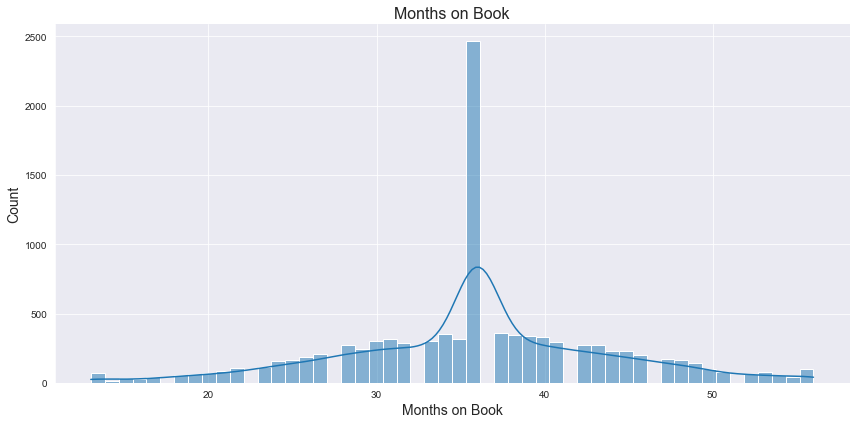

In [20]:
"""Closer examination of Months on Book data, which is simply odd. Appears heavily preprocessed"""
plt.figure(figsize=(12,6))
sns.histplot(data=raw_df, x="Months_on_book", kde=True)
plt.title("Months on Book", fontsize=16)
plt.xlabel("Months on Book", fontsize=14)
plt.ylabel("Count", fontsize=14)
plt.tight_layout()
sns.despine()
plt.savefig('MonthsonBook', dpi=300)

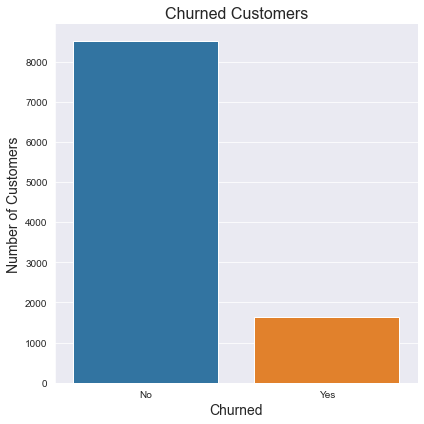

In [21]:
"""Closer examination of imbalance within the dataset with regards to the target variable"""
plt.figure(figsize=(6, 6))
ax = sns.countplot(data=raw_df, x='Attrition_Flag')
plt.title("Churned Customers", fontsize=16)
plt.xlabel("Churned", fontsize=14)
plt.ylabel("Number of Customers", fontsize=14)
plt.xticks(ticks=[0, 1], labels=["No", "Yes"])
plt.tight_layout()
sns.despine()
plt.savefig("AttritedCustomers", dpi=300)

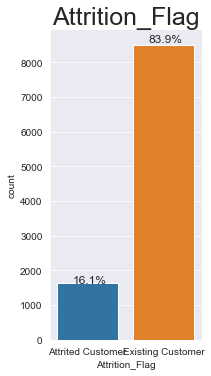

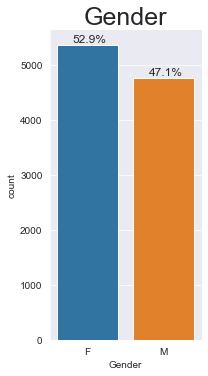

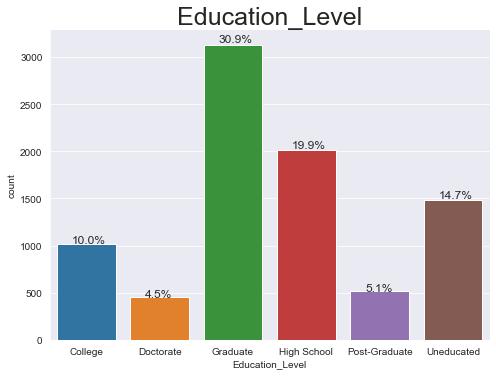

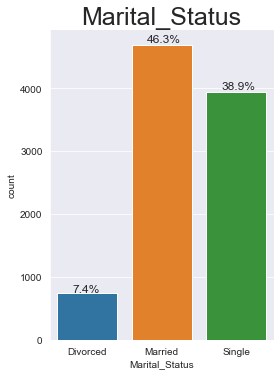

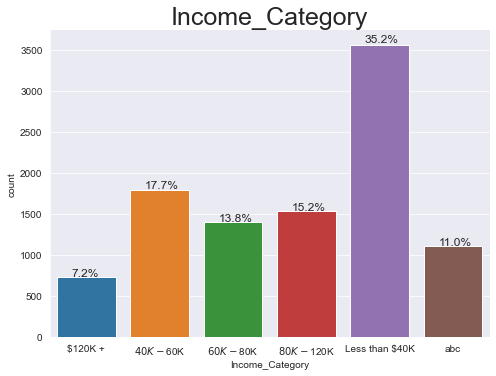

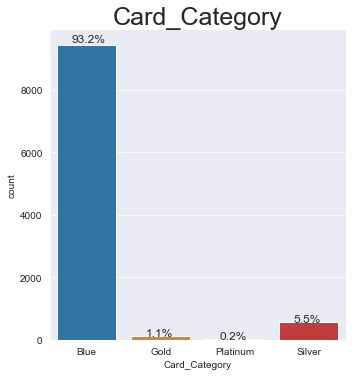

In [22]:
"""Examination of frequencies of all categorical features"""
for i in range(len(cat_cols)):
    barplot_annot(raw_df, cat_cols[i], h=0.01, w=0.25)

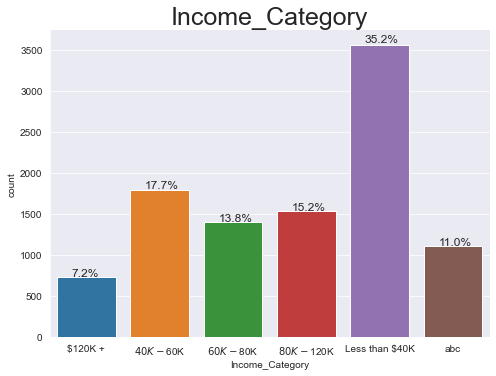

<Figure size 432x288 with 0 Axes>

In [23]:
barplot_annot(raw_df, 'Income_Category', h=0.01, w=0.25)
plt.savefig('Income_Category', dpi=300)

#### Notes
- **Attrition_Flag**, the target variable is heavily imbalanced. With **83.9% of customers remaining, while 16.1% attrited (churned).**
- **Gender** follows a reasonable balance of **52.9% Female and 47.1% Male.**
- **Education_Level** is reasonably distributed, with the most common being **Graduate (as in graduated college) at 30.9%.**
- **Marital_Status** is almost completely **Married (46.3%)** and **Single (38.9%)**, with only a small proportion **(7.4%) being divorced**. 
- **Income_category** us soread relatively evenly, with **less than 40K being the most prevalent (35.2%).** The **abc category will need to be turned into NaNs, which will create NaNs in 11% of the dataset to be interpolated to less than 40k in that instance. Not ideal.**
- **Card_Category** is nearly all **Blue (93.2%)**. It may be worthwhile putting all other categories, **Silver, Gold, and Platinum into simply an "Other" column.** Will need to wait for further EDA before making that call.


## Next Steps
1. Adjust the types to correpsond to the correct data type for each feature
2. Set Index as CLIENTNUM
3. Replace "abc" in Income Category as NaNs for later interpolation
4. Further examination of the data, before data split and modeling



In [24]:
"""Create dataframe to clean and complete exporation with"""
eda_df = raw_df.copy() # Copy dataframe from raw
del raw_df # Remove raw dataframe

In [25]:
eda_df.set_index('CLIENTNUM', inplace=True) # Set index as CLIENTNUM
eda_df.Income_Category.replace('abc', np.nan, inplace=True) # Replace 'abc' with NaNs

<AxesSubplot:ylabel='CLIENTNUM'>

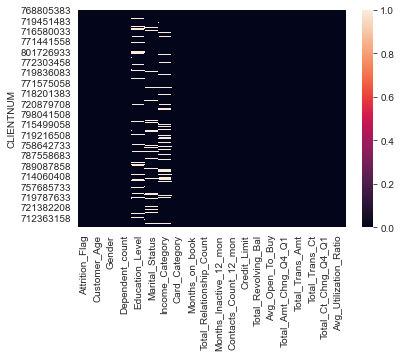

In [26]:
sns.heatmap(eda_df.isna()) # Confirm new NaNs, but also assess for any obvious patterns

#### No obvious patterns within the NaN values that could be easily addressed later

In [27]:
eda_df.describe() # Examine numerical data descriptive stats

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,"10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00"
mean,46.33,2.35,35.93,3.81,2.34,2.46,"8,631.95","1,162.81","7,469.14",0.76,"4,404.09",64.86,0.71,0.27
std,8.02,1.30,7.99,1.55,1.01,1.11,"9,088.78",814.99,"9,090.69",0.22,"3,397.13",23.47,0.24,0.28
min,26.00,0.00,13.00,1.00,0.00,0.00,"1,438.30",0.00,3.00,0.00,510.00,10.00,0.00,0.00
25%,41.00,1.00,31.00,3.00,2.00,2.00,"2,555.00",359.00,"1,324.50",0.63,"2,155.50",45.00,0.58,0.02
50%,46.00,2.00,36.00,4.00,2.00,2.00,"4,549.00","1,276.00","3,474.00",0.74,"3,899.00",67.00,0.70,0.18
75%,52.00,3.00,40.00,5.00,3.00,3.00,"11,067.50","1,784.00","9,859.00",0.86,"4,741.00",81.00,0.82,0.50
max,73.00,5.00,56.00,6.00,6.00,6.00,"34,516.00","2,517.00","34,516.00",3.40,"18,484.00",139.00,3.71,1.00


In [28]:
eda_df.describe(exclude=np.number) # Examine categorical descriptive stats

,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Card_Category
count,10127,10127,8608,9378,9015,10127
unique,2,2,6,3,5,4
top,Existing Customer,F,Graduate,Married,Less than $40K,Blue
freq,8500,5358,3128,4687,3561,9436


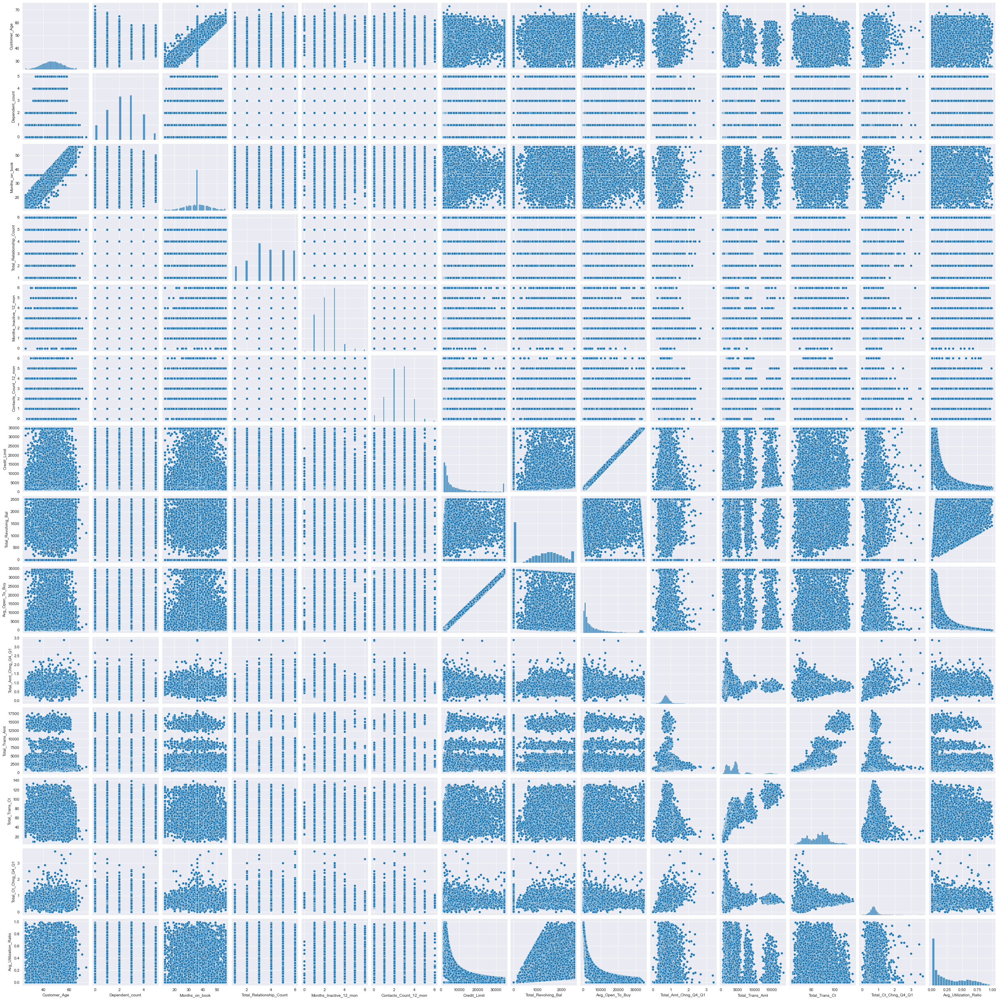

In [29]:
# General pairplot for any related trends
sns.pairplot(eda_df) 

<AxesSubplot:>

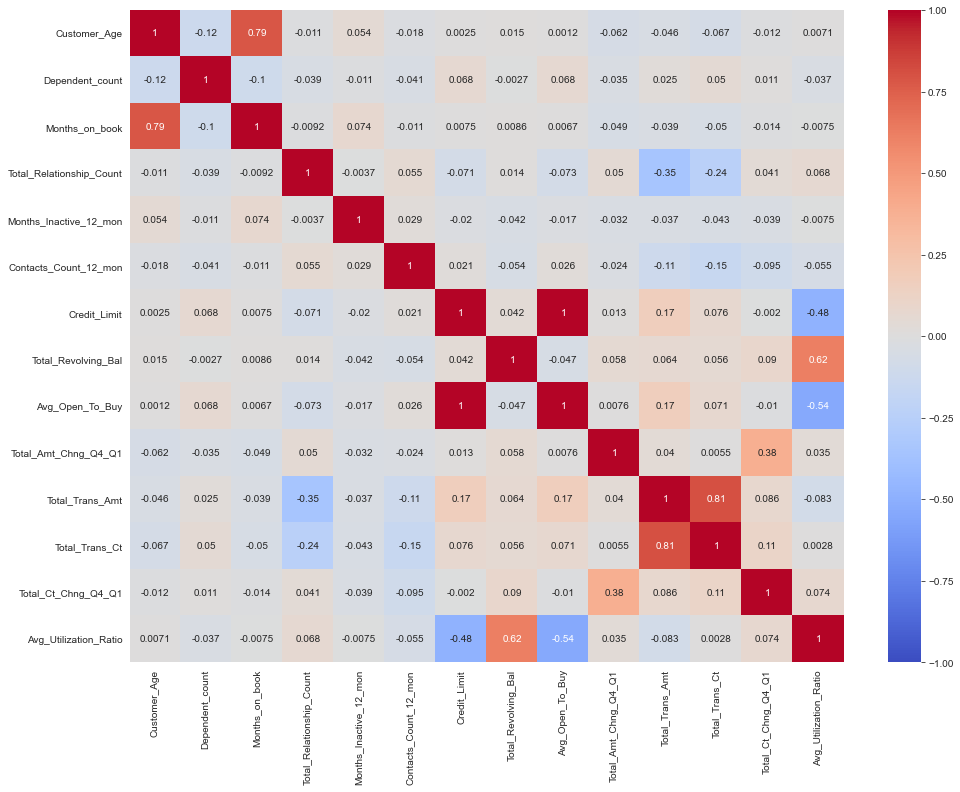

In [30]:
plt.figure(figsize=(16, 12))
sns.heatmap(eda_df.corr(), vmin=-1, vmax=1, cmap='coolwarm', annot=True)

#### Notes
- **Avg_Open_To_Buy** and **Credit_Limit** have a perfect positive correlation, therefore one can be dropped from the analysis.  **Avg_Open_To_Buy** will be dropped due to the fact that it is somewhat more in control of the customer, while **Credit_Limit** is designated based on customer behavior, but designated by the bank itself. As in the end, the bank is concerned with ways to change their behavior with regards to the customer and therefore **Credit_Limit** is likely slightly more pertinent.
- **Total_Trans_Ct** and **Total_Trans_Amt** are highly correlated as well (0.81). This makes intuitive sense that most transactions are similar in price, so the count of transactions and total amount are strongly correlated. The correlation is strong enough we'll proceed into the model with only **Total_Trans_Ct**.
- The last strong correlation (over 0.75) is between **Customer_Age** and **Months_on_book** (0.79). Only one of these will be retained. **Months_on_book** will be kept as it implies something not only about the customers age, but is an actual metric of how long the individual has been a customer with the bank.
- **Avg_Utilization_Ratio** is has mutiple correlation with **Credi_Limit** (-0.48), **Total_Revolving_Bal** (0.62), and **Avg_Open_To_Buy** (-0.54). In addition, if you look at the pairplot you can see that **Avg_Utilzation_Ratio** has strong relationships to those variables, they simply are not linear. This metric is likely used to derive or guide how the other features and possibly benefit the customer recieves by the bank are assigned. This would explain the strong bounding effects we see with regards to these variables. Therefore, this variable will be dropped as it's influence will still be retained in the model through those other three features.
- There are several other correlations of interest, but are not as strong or repeated across variable so they will be retiained.

<AxesSubplot:xlabel='Months_on_book', ylabel='Customer_Age'>

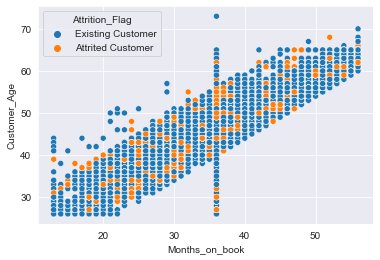

In [31]:
"""Closer examination of strong correlation with odd line through it"""
sns.scatterplot(data=eda_df, x='Months_on_book', y='Customer_Age', hue="Attrition_Flag")

- Line is due to the odd spike a the median of Months_on_book observed previously. Otherwise the correlation between how long you have been with the bank and Customer_Age is quite intuitive.

<AxesSubplot:xlabel='Credit_Limit', ylabel='Avg_Open_To_Buy'>

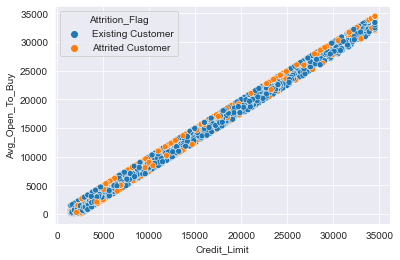

In [32]:
"Check on perfect correlation between Credit Limit and Avg_Open_To_buy"
sns.scatterplot(data=eda_df, x='Credit_Limit', y='Avg_Open_To_Buy', hue="Attrition_Flag")

<AxesSubplot:xlabel='Total_Trans_Amt', ylabel='Total_Relationship_Count'>

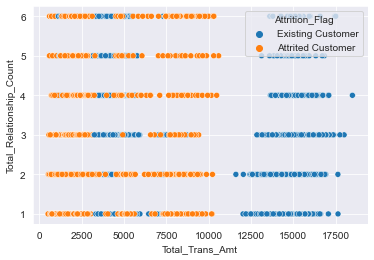

In [33]:
"""Examining intersting split in data, especailly due to grouping based on Attrition_Flag"""
sns.scatterplot(data=eda_df, x='Total_Trans_Amt', y='Total_Relationship_Count', hue="Attrition_Flag")

- Total_Trans_Amt and Total_Relationship_Count are good potential candidates for influencing churn.

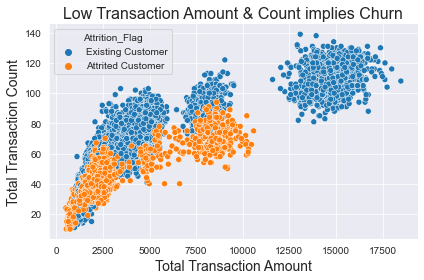

In [34]:
"""Detailed plot of relationship between Total_Tran_Amt and Total_Trans_Ct"""
plt.figure()
ax = sns.scatterplot(data=eda_df, x='Total_Trans_Amt', y='Total_Trans_Ct', hue='Attrition_Flag', legend='brief')
plt.title("Low Transaction Amount & Count implies Churn", fontsize=16)
plt.xlabel("Total Transaction Amount", fontsize=14)
plt.ylabel("Total Transaction Count", fontsize=14)
plt.tight_layout()
sns.despine()
plt.savefig("TransactionChurnFig", dpi=300)

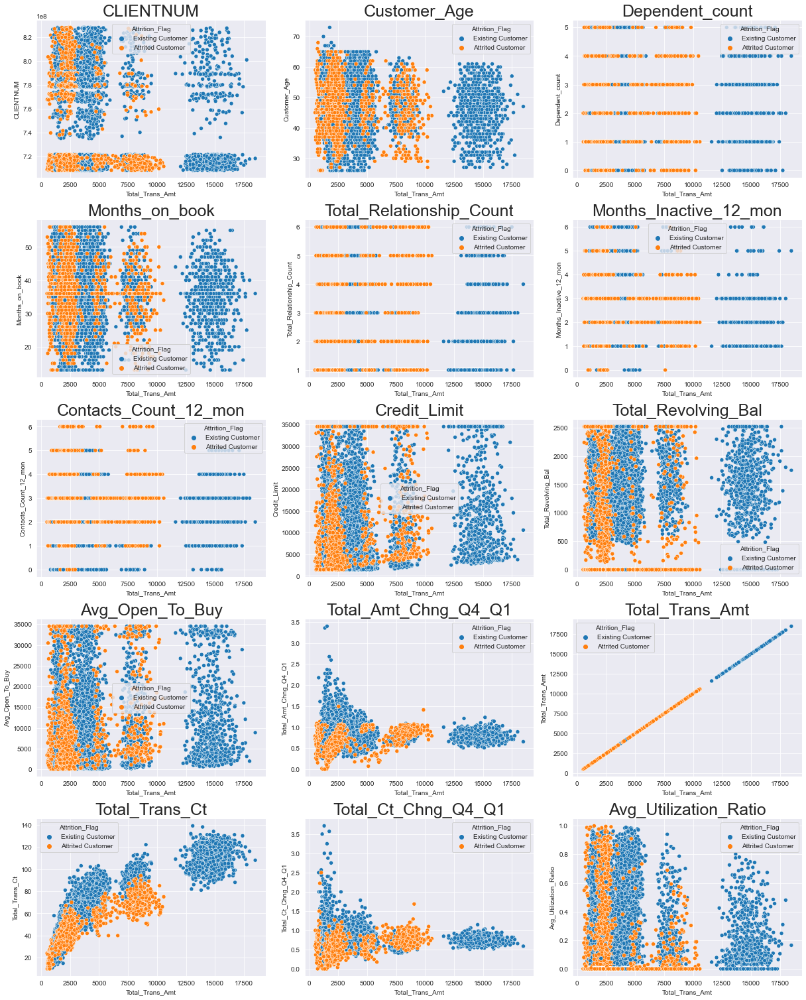

In [35]:
"""Generalized assessment of various numerical feature with regards to the target variable and Total_Trans_Amt"""
plt.figure(figsize=(17, 75))
for i in range(len(num_cols)):
    plt.subplot(18, 3, i + 1)
    sns.scatterplot(data=eda_df, x='Total_Trans_Amt', y=num_cols[i], hue="Attrition_Flag")
    plt.tight_layout()
    plt.title(num_cols[i], fontsize=25)
    sns.despine()

- Total_Trans_Amt suggests it may be related to a lot of grouping or relationships that may not be linear in a number of the other features. If one needs to be dropped it may be worth dropping this one to limit collinearity within the different features more broadly.

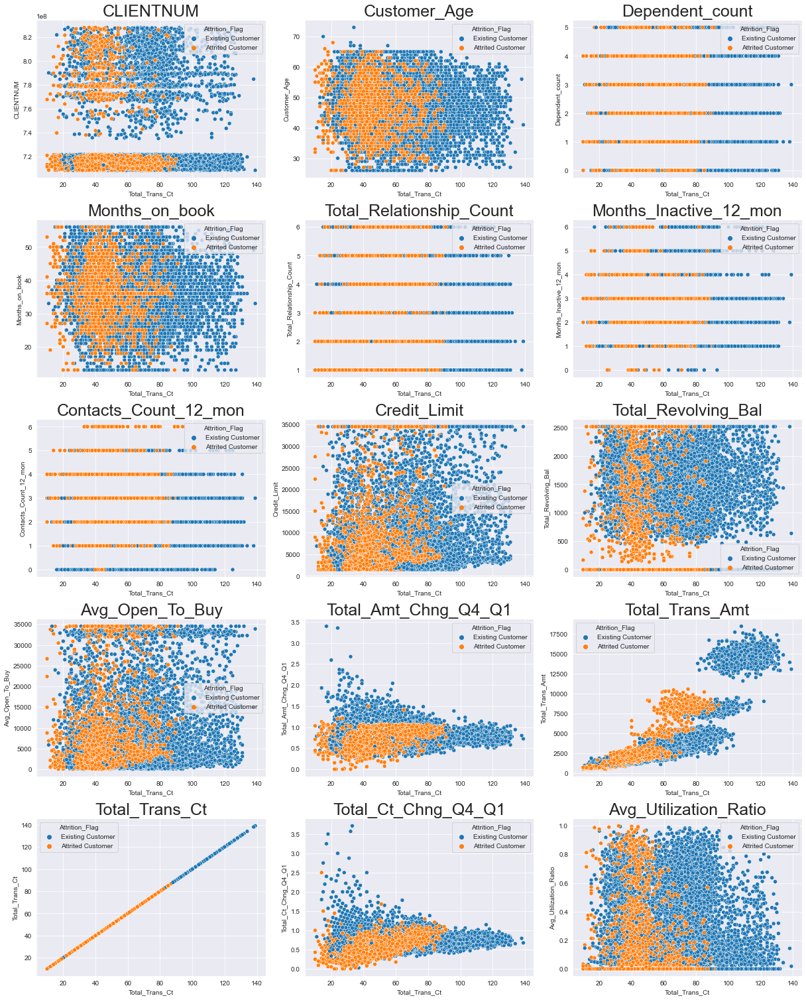

In [36]:
"""Generalized assessment of various numerical feature with regards to the target variable and Total_Trans_Ct"""
plt.figure(figsize=(17, 75))
for i in range(len(num_cols)):
    plt.subplot(18, 3, i + 1)
    sns.scatterplot(data=eda_df, x='Total_Trans_Ct', y=num_cols[i], hue="Attrition_Flag")
    plt.tight_layout()
    plt.title(num_cols[i], fontsize=25)
    sns.despine()

- Total_Trans_Ct does not appear to have as strong of relationships with the other features, but you can still see similar trnds to some of the features.

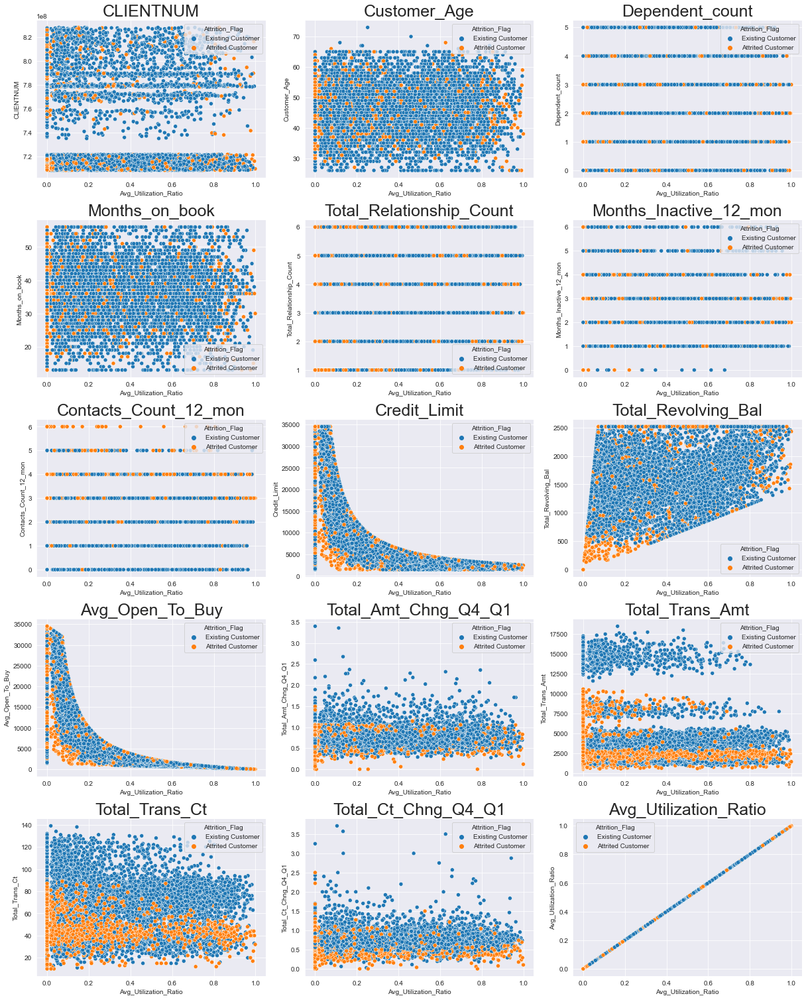

In [37]:
"""General assessment of Avg_Utilization_Ratio to all numeric features with regards to the target variable"""
plt.figure(figsize=(17, 75))
for i in range(len(num_cols)):
    plt.subplot(18, 3, i + 1)
    sns.scatterplot(data=eda_df, x='Avg_Utilization_Ratio', y=num_cols[i], hue="Attrition_Flag")
    plt.tight_layout()
    plt.title(num_cols[i], fontsize=25)
    sns.despine()

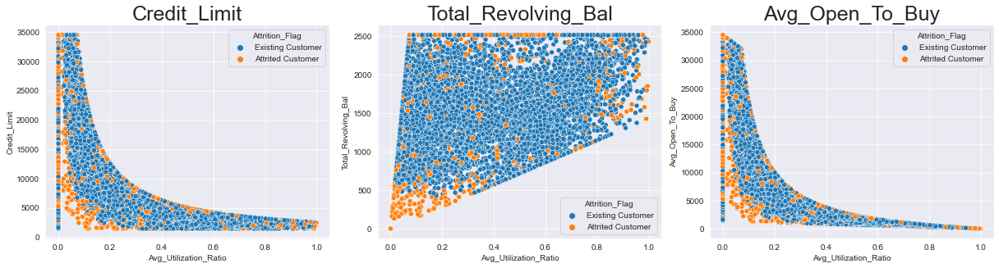

In [38]:
"""Closer examination of 3 feature of interest that show non-linear, but very strong interactions with Avg_Utilization_Ratio"""
interest = ["Credit_Limit", "Total_Revolving_Bal", "Avg_Open_To_Buy"]
plt.figure(figsize=(17, 75))
for i in range(len(interest)):
    plt.subplot(18, 3, i + 1)
    sns.scatterplot(data=eda_df, x='Avg_Utilization_Ratio', y=interest[i], hue="Attrition_Flag")
    plt.tight_layout()
    plt.title(interest[i], fontsize=25)
    sns.despine()
plt.savefig("UtilizationFig", dpi=300)

In [39]:
def stacked_barplot(df, predictor, target):
    """
    Print the category counts and plot a stacked bar plot.
    
    df: dataframe
    predictor: independent variable
    target: target (dependent) variable
    """
    count = df[predictor].nunique()
    sorter = df[target].value_counts().index[-1]
    tab1 = pd.crosstab(df[predictor], df[target], margins=True).sort_values(by=sorter, ascending=False)
    print(tab1)
    print("*"*120)
    tab = pd.crosstab(df[predictor], df[target], normalize="index").sort_values(by=sorter, ascending=False)
    
    tab.plot(kind="bar", stacked=True, figsize=(count + 5, 5))
    plt.legend(loc="lower left", frameon=False)
    plt.legend(loc="upper left", bbox_to_anchor=(1,1))
    plt.show()

Attrition_Flag     Attrited Customer  Existing Customer    All
Attrition_Flag                                                
Attrited Customer               1627                  0   1627
All                             1627               8500  10127
Existing Customer                  0               8500   8500
************************************************************************************************************************


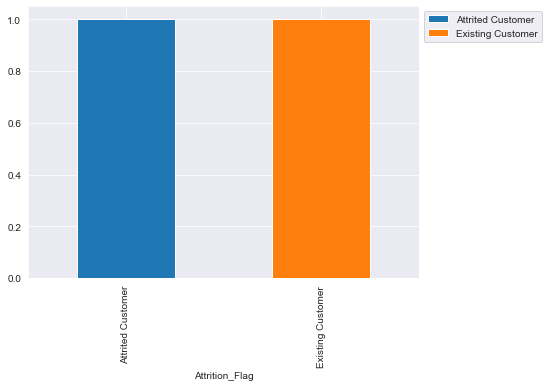

Attrition_Flag  Attrited Customer  Existing Customer    All
Gender                                                     
All                          1627               8500  10127
F                             930               4428   5358
M                             697               4072   4769
************************************************************************************************************************


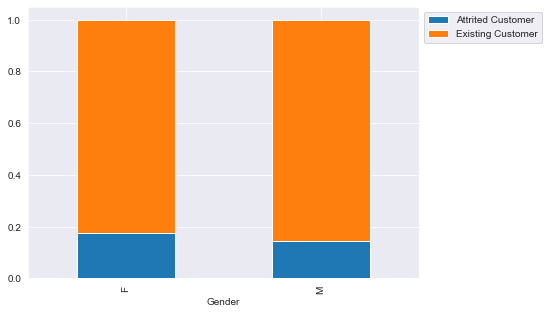

Attrition_Flag   Attrited Customer  Existing Customer   All
Education_Level                                            
All                           1371               7237  8608
Graduate                       487               2641  3128
High School                    306               1707  2013
Uneducated                     237               1250  1487
College                        154                859  1013
Doctorate                       95                356   451
Post-Graduate                   92                424   516
************************************************************************************************************************


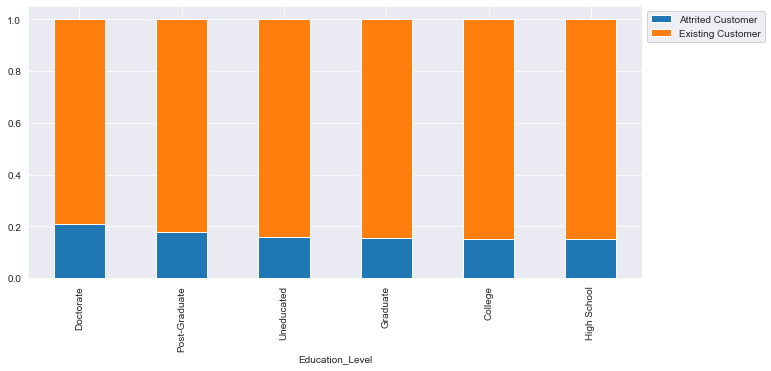

Attrition_Flag  Attrited Customer  Existing Customer   All
Marital_Status                                            
All                          1498               7880  9378
Married                       709               3978  4687
Single                        668               3275  3943
Divorced                      121                627   748
************************************************************************************************************************


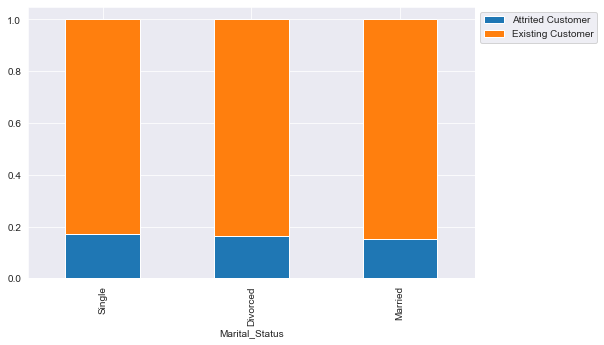

Attrition_Flag   Attrited Customer  Existing Customer   All
Income_Category                                            
All                           1440               7575  9015
Less than $40K                 612               2949  3561
$40K - $60K                    271               1519  1790
$80K - $120K                   242               1293  1535
$60K - $80K                    189               1213  1402
$120K +                        126                601   727
************************************************************************************************************************


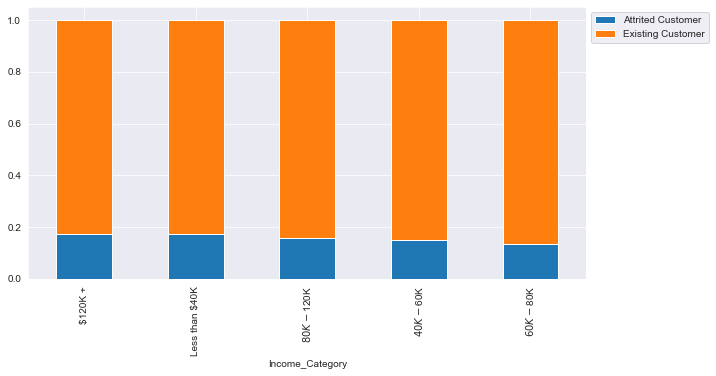

Attrition_Flag  Attrited Customer  Existing Customer    All
Card_Category                                              
All                          1627               8500  10127
Blue                         1519               7917   9436
Silver                         82                473    555
Gold                           21                 95    116
Platinum                        5                 15     20
************************************************************************************************************************


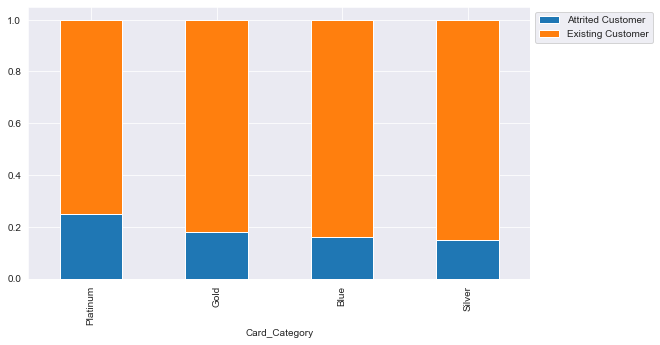

In [40]:
"""Generalized assessement of categorical features with regards to the target variable"""
for i in range(len(cat_cols)):
    stacked_barplot(eda_df, cat_cols[i], 'Attrition_Flag')

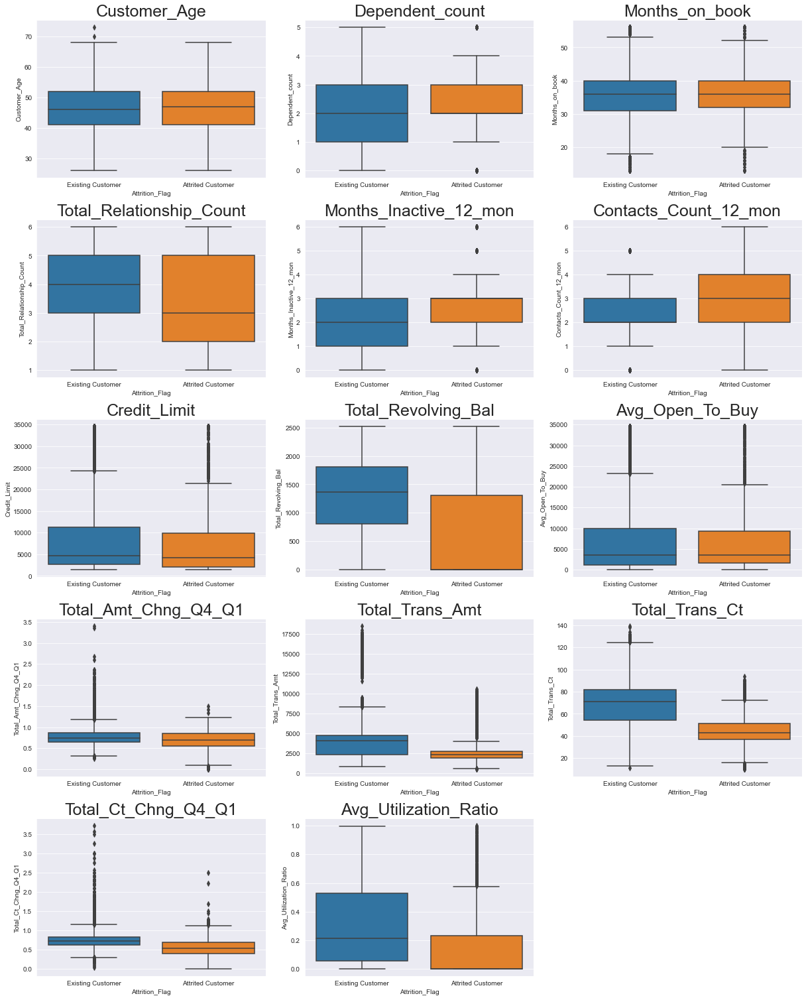

In [41]:
"""Generalized Boxplots to assess numerical features explcity to the target variable"""
num_cols = pd.Series(eda_df.select_dtypes(include=np.number).columns)
plt.figure(figsize=(17, 75))
for i in range(len(num_cols)):
    plt.subplot(18, 3, i + 1)
    sns.boxplot(data=eda_df, x='Attrition_Flag', y=num_cols[i])
    plt.tight_layout()
    plt.title(num_cols[i], fontsize=25)
    sns.despine()

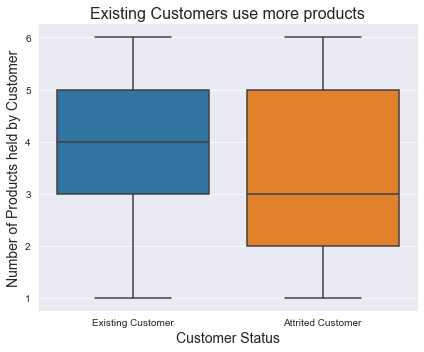

In [42]:
"""Closer Examination of Number of Products held by Customers"""
plt.figure(figsize=(6, 5))
sns.boxplot(data=eda_df, x='Attrition_Flag', y="Total_Relationship_Count")
plt.title("Existing Customers use more products", fontsize=16)
plt.xlabel("Customer Status", fontsize=14)
plt.ylabel("Number of Products held by Customer", fontsize=14)
plt.tight_layout()
sns.despine()
plt.savefig("ProductsHeld", dpi=300)



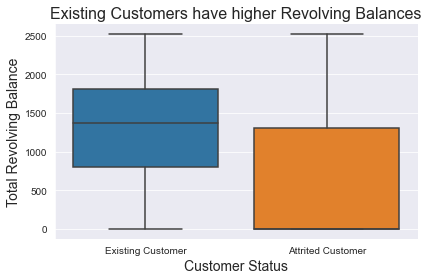

In [43]:
"""Closer examination of Total Revolving Balance"""
plt.figure(figsize=(6, 4))
sns.boxplot(data=eda_df, x = "Attrition_Flag", y="Total_Revolving_Bal")
plt.title("Existing Customers have higher Revolving Balances", fontsize=16)
plt.xlabel("Customer Status", fontsize=14)
plt.ylabel("Total Revolving Balance", fontsize=14)
# plt.ylim(0)
plt.tight_layout()
sns.despine()
plt.savefig("RevolvingBalances", dpi=300)

- Both Total Revolving balance and the number of products held by a customer imply that the the customer who retained may fall maintain higher levels of a revolving balance and hold more products with the bank. This would make sense, as it would imply a more regular utilization of the bank and its services.

### Preparing Prelinary Model Dataset

In [44]:
to_drop = ["Avg_Open_To_Buy",
          "Total_Trans_Amt",
          "Customer_Age",
          "Avg_Utilization_Ratio"]
model_dataset = eda_df.drop(columns=to_drop)

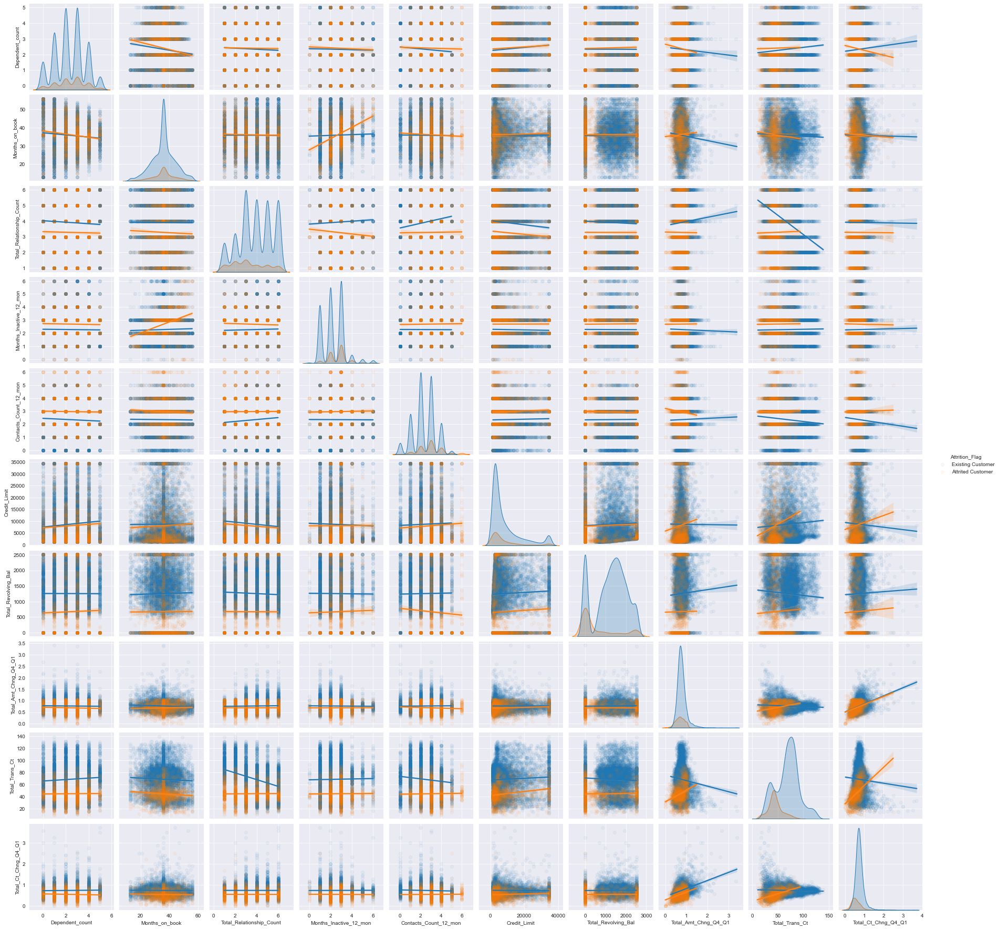

In [45]:
sns.pairplot(model_dataset, hue='Attrition_Flag', kind='reg', plot_kws={'scatter_kws':{'alpha':0.05}})

#### Notes:
- There are potentially distinct differences in the remaiing features with regards to **Attrition Flag**. This is a good sign for the model as it should be able to use these variations to predict whether or not a customer is likely to churn.

<AxesSubplot:>

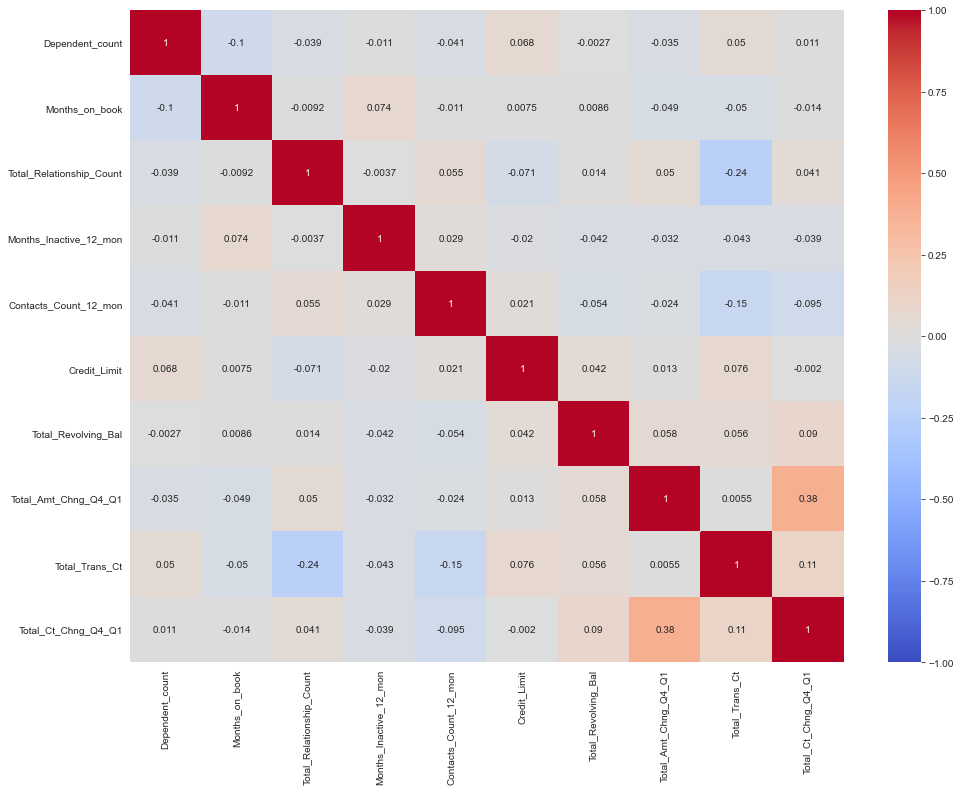

In [46]:
plt.figure(figsize=(16, 12))
sns.heatmap(model_dataset.corr(), vmin=-1, vmax=1, cmap='coolwarm', annot=True)

#### There a limited number of strong correlations within this preliminary model dataset, which should limit collinearities within the model features.


## Classification Models
### Primary objective: To make a model that classifies whether or not a customer will churn from the list of customers who have a credit card account. Specifically, the bank is concerned about its services to the customer and what they may be able to change or improve upon to limit the churn.

***This means the only variable upon which the model should be built are customer service related features of the data. Features that are related to charateristics of the customer are not relevant. The bank is interested in retaining customers, limiting churn, regardless of the characteristics of the customer.***

**The features that pertain to customer service or features the bank can influence are:**
1. Attrition_Flag (the target variable): whether a customer churned or not
2. Card_Category: What type of card the customer holds/held (Blue, Silver, Gold, or Platinum)
3. Months_on_book: Period of relationship with the bank
4. Total_Relationship_Count: Total number of products held by the customer
5. Months_Inactive_12_mon: Number of months inactive in the last 12 months
6. Contacts_Count_12_mon: Number of contacts between the custiomer and bank in the last 12 months
7. Credit_LImit: Credit limit on the customers credit card
8. Total_Revolving_Bal: The balance that carries over from one month to the next
9. Avg_Open_To_Buy: The average amount left on the credit card to use (average is over last 12 months)
10. Total_Trans_Amt: Total Traansaction Amount (last 12 months)
11. Total_Trans_Ct: Total Transaction Count (last 12 months)
12. Total_Ct_Chng_Q4_Q1: Ratio of the total transaction count in 4th quarter and the total transaction count in the 1st quarter
13. Total_Amt_Chng_Q4_Q1: Ratio of the total transaction amount in the 4th quarter and the total transaction amount in the 1st quarter
14. Avg_Utilization_ratio: How much available credit the customer spent

**The features that pertain to the customer that the bank can not influence are:**
1. Customer_Age
2. Gender
3. Dependent_count
4. Education_Level
5. Marital_Status
6. Income_Category

### The key metric for the models will be Recall.
***The models will aim to avoid false negatives, which would be failing to identify a customer who does churn. This will lead to higher rates of false positives, which would be incorrectly classifying a customer as churning when they would not.***

**The bank is concerned with not losing additional customers, therefore, it is most important to identify a customer who is likely to churn. For these models, it is assumed that identifying a customer that does not end up churning, leading to the bank spending resources attempting to ensure they stay a customer, is considered a lower cost than failing to identify a customer who does churn. As a result, the models will optimize Recall more so than Precision or Accuracy.**

In [47]:
"""Select important features and prepare actual model dataset"""
model_df = model_dataset.copy() # Create Model dataframe from preliminary model dataset
# Generate list of features that are not relevant due to the bank wanting to change their behavior
to_drop = ["Gender",
          "Dependent_count",
          "Education_Level",
          "Marital_Status",
          "Income_Category"]

model_df.drop(columns=to_drop, inplace=True) # Drop features that are solely customer descriptors

In [48]:
"""Separate Target Variable from features and generate dummy columns for categorical data"""
X = model_df.drop(columns="Attrition_Flag") # Drop target variable from dataset
X = pd.get_dummies(X, drop_first=True) # Convert all categorical features into dummy columns
Y = model_df["Attrition_Flag"] # Select Target variable
Y = pd.get_dummies(Y, drop_first=True) # Make Target Variable a {'Exiting Customer': 1, 'Attrited Customer': 0}

In [49]:
"""Split data into training, validation, and testing datasets"""
rand_st = 1 # Set Random State
X_temp, X_test, Y_temp, Y_test = train_test_split(X, Y, test_size=0.2, random_state=rand_st, stratify=Y) # Split testing dataset off
X_train, X_val, Y_train, Y_val = train_test_split(X_temp, Y_temp, test_size=0.25, random_state=rand_st, stratify=Y_temp) # Split training and validation

print(X_train.shape, X_val.shape, X_test.shape) # Check shapes of training, validation, and test datasets

(6075, 12) (2026, 12) (2026, 12)


In [50]:
"""Impute missing values in the data"""
imputer = SimpleImputer(strategy="median") # Initialize simple Median imputiation for missing values
impute = imputer.fit(X_train) # Impute median values based on training dataset

X_train = impute.transform(X_train) # Transform missing values in training dataset to imputed medians
X_val = impute.transform(X_val) # Transform missing values in validation dataset to imputed medians
X_test = impute.transform(X_test) # Transform missing values in test dataset to imputed medians

In [51]:
"""Build loop to test basic models for baseline performance of model on training dataset"""
models = [] # Initialize array for all types of models
models.append(("Bagging", BaggingClassifier(random_state=rand_st))) # Set Bagging model initialization
models.append(("Random forest", RandomForestClassifier(random_state=rand_st))) # Set Random Forest model initialization
models.append(("GBM", GradientBoostingClassifier(random_state=rand_st))) # Set GradientBoostingClassifier model initialization
models.append(("Adaboost", AdaBoostClassifier(random_state=rand_st))) # Set AdaBoostClassifier model initialization
models.append(("Xgboost", XGBClassifier(random_state=rand_st, eval_metric="logloss"))) # Set XGBClassifier model initialization
models.append(("dtree", DecisionTreeClassifier(random_state=rand_st))) # Set DecisionTreeClassifier model initialization
models.append(("logreg", LogisticRegression(random_state=rand_st))) # Set LogisticRegression model initialization

results = [] # Initialize array for model results
names = [] # Initialize array for model names

print("\n" "Cross-Validation Performance:" "\n")

for name, model in models:
    scoring='recall' # Set priority scoring metric
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=rand_st) # Set cross validation settings
    cv_result = cross_val_score(estimator=model, X=X_train, y=Y_train, scoring=scoring, cv=kfold) # Obtain CV results of model on training dataset
    results.append(cv_result) # Store CV result into results array
    names.append(name) # Store model name into name array
    print(f"{name}: {cv_result.mean()*100}")
    
print("\n", "Training Performance:", "\n")

for name, model in models:
    model.fit(X_train, Y_train) # Fit model to training set
    scores = recall_score(Y_train, model.predict(X_train))*100 # Obtain recall metric of model on training dataset
    print(f"{name}: {scores}")



Cross-Validation Performance:

Bagging: 95.6660701572091
Random forest: 97.64673170543978
GBM: 97.7055744770921
Adaboost: 96.62685447093459
Xgboost: 96.97983413188632
dtree: 93.5870037907214
logreg: 97.05836171563817

 Training Performance: 

Bagging: 99.7254363600706
Random forest: 100.0
GBM: 98.31339478329085
Adaboost: 96.8817415179447
Xgboost: 100.0
dtree: 100.0
logreg: 97.17591684644049


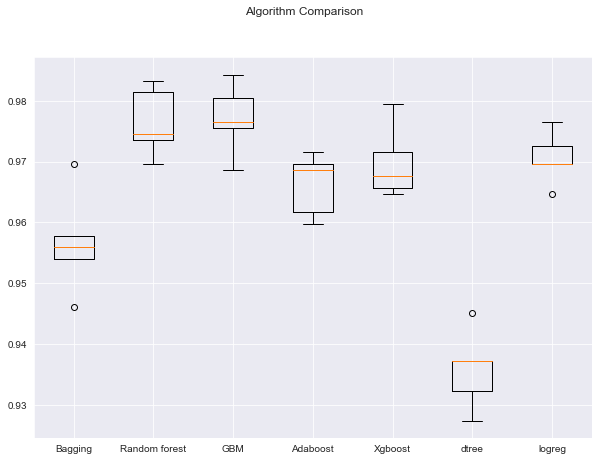

In [52]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure(figsize=(10, 7))

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results)
ax.set_xticklabels(names)

plt.show()

#### Imbalanced Dataset Model training performaces (base model)
- The best mean performance in the cross validation is **GradientBoosterClassifier** at 97.7 for Recall.
- It is followed closely, by **Random Forest** at 97.6 for Recall. However, **Random Forest** is more likely to have heavier overfitting. Therefore, ***GradeientBoosterClassifier model will be taken and tuned as the best model from the unbalanced dataset to be hypertuned.***

In [53]:
"""Oversampling of the data through SMOTE"""
print("Before UpSampling, counts of label 'Existing Customer': {}".format(np.sum(Y_train == 1)))
print("Before UpSampling, counts of label 'Churned Customer': {} \n".format(np.sum(Y_train == 0)))

smote = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=rand_st) # Initialize SMOTE for oversampling
# Use SMOTE to oversample the data to balance it with regards to the target variable
X_train_over, Y_train_over = smote.fit_resample(X_train, Y_train) 

print(f"After UpSampling, counts of label 'Existing Customer': {np.sum(Y_train_over == 1)}")
print(f"After UpSampling, counts of label 'Churned Customer': {np.sum(Y_train_over == 0)} \n")

print(f"After UpSampling, the shape of dataset (X_train): {X_train_over.shape}")
print(f"After UpSampling, the shape of target set (Y_train): {Y_train_over.shape} \n")

Before UpSampling, counts of label 'Existing Customer': Existing Customer    5099
dtype: int64
Before UpSampling, counts of label 'Churned Customer': Existing Customer    976
dtype: int64 

After UpSampling, counts of label 'Existing Customer': Existing Customer    5099
dtype: int64
After UpSampling, counts of label 'Churned Customer': Existing Customer    5099
dtype: int64 

After UpSampling, the shape of dataset (X_train): (10198, 12)
After UpSampling, the shape of target set (Y_train): (10198, 1) 



In [54]:
"""Build loop to test basic models for baseline performance of model on over sampled training dataset"""
models = [] # Initialize array for all types of models
models.append(("Bagging", BaggingClassifier(random_state=rand_st))) # Set Bagging model initialization
models.append(("Random forest", RandomForestClassifier(random_state=rand_st))) # Set Random Forest model initialization
models.append(("GBM", GradientBoostingClassifier(random_state=rand_st))) # Set GradientBoostingClassifier model initialization
models.append(("Adaboost", AdaBoostClassifier(random_state=rand_st))) # Set AdaBoostClassifier model initialization
models.append(("Xgboost", XGBClassifier(random_state=rand_st, eval_metric="logloss"))) # Set XGBClassifier model initialization
models.append(("dtree", DecisionTreeClassifier(random_state=rand_st))) # Set DecisionTreeClassifier model initialization
models.append(("logreg", LogisticRegression(random_state=rand_st))) # Set LogisticRegression model initialization

results = [] # Initialize array for model results
names = [] # Initialize array for model names

print("\n" "Cross-Validation Performance:" "\n")

for name, model in models:
    scoring='recall' # Set priority scoring metric
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=rand_st) # Set cross validation settings
    cv_result = cross_val_score(estimator=model, X=X_train_over, y=Y_train_over, scoring=scoring, cv=kfold) # Obtain CV results of model on training dataset
    results.append(cv_result) # Store CV result into results array
    names.append(name) # Store model name into name array
    print(f"{name}: {cv_result.mean()*100}")
    
print("\n", "Training Performance:", "\n")

for name, model in models:
    model.fit(X_train_over, Y_train_over) # Fit model to training set
    scores = recall_score(Y_train_over, model.predict(X_train_over))*100 # Obtain recall metric of model on training dataset
    print(f"{name}: {scores}")



Cross-Validation Performance:

Bagging: 93.29277069021916
Random forest: 95.8424830187227
GBM: 95.78354403586754
Adaboost: 93.54782658892802
Xgboost: 96.68567800034636
dtree: 92.07691123554427
logreg: 81.25141911524179

 Training Performance: 

Bagging: 99.29397921161012
Random forest: 100.0
GBM: 96.54834281231615
Adaboost: 93.54775446165915
Xgboost: 99.98038831143361
dtree: 100.0
logreg: 81.62384781329672


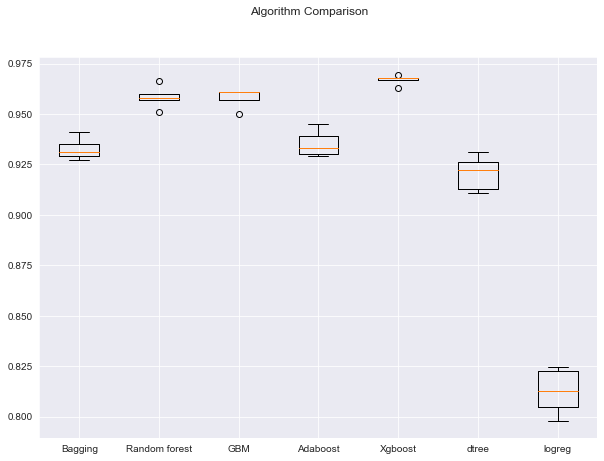

In [55]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure(figsize=(10, 7))

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results)
ax.set_xticklabels(names)

plt.show()

#### Balanced Oversampled Dataset Model training performaces (oversampled models)
- The best mean performance in the cross validation is **XGBoostClassifier** at 96.7 for Recall.
- Both **Random Forest** and **GradientBoostClassifier** are close in performance with 95.8 and 95.78 respectively. However, **XGBoostClassifier performed slightly better and has a better clustering from the cross validation results**. Therefore, ***XGBoostClassifier will be use for further hypertuning from the oversampled models.***

In [56]:
"""Undersampling of the data through RandomUnderSampler"""
print("Before UnderSampling, counts of label 'Existing Customer': {}".format(np.sum(Y_train == 1)))
print("Before UnderSampling, counts of label 'Churned Customer': {} \n".format(np.sum(Y_train == 0)))

undersample = RandomUnderSampler(random_state=rand_st) # Initialize RandomUnderSampler
# Undersample the training dataset to create a balanced dataset with regards to the target variable
X_train_under, Y_train_under = undersample.fit_resample(X_train, Y_train)

print(f"After UnderSampling, counts of label 'Existing Customer': {np.sum(Y_train_under == 1)}")
print(f"After UnderSampling, counts of label 'Churned Customer': {np.sum(Y_train_under == 0)} \n")

print(f"After UnderSampling, the shape of dataset (X_train): {X_train_under.shape}")
print(f"After UnderSampling, the shape of target set (Y_train): {Y_train_under.shape} \n")

Before UnderSampling, counts of label 'Existing Customer': Existing Customer    5099
dtype: int64
Before UnderSampling, counts of label 'Churned Customer': Existing Customer    976
dtype: int64 

After UnderSampling, counts of label 'Existing Customer': Existing Customer    976
dtype: int64
After UnderSampling, counts of label 'Churned Customer': Existing Customer    976
dtype: int64 

After UnderSampling, the shape of dataset (X_train): (1952, 12)
After UnderSampling, the shape of target set (Y_train): (1952, 1) 



In [57]:
"""Build loop to test basic models for baseline performance of model on under sampled training dataset"""
models = [] # Initialize array for all types of models
models.append(("Bagging", BaggingClassifier(random_state=rand_st))) # Set Bagging model initialization
models.append(("Random forest", RandomForestClassifier(random_state=rand_st))) # Set Random Forest model initialization
models.append(("GBM", GradientBoostingClassifier(random_state=rand_st))) # Set GradientBoostingClassifier model initialization
models.append(("Adaboost", AdaBoostClassifier(random_state=rand_st))) # Set AdaBoostClassifier model initialization
models.append(("Xgboost", XGBClassifier(random_state=rand_st, eval_metric="logloss"))) # Set XGBClassifier model initialization
models.append(("dtree", DecisionTreeClassifier(random_state=rand_st))) # Set DecisionTreeClassifier model initialization
models.append(("logreg", LogisticRegression(random_state=rand_st))) # Set LogisticRegression model initialization

results = [] # Initialize array for model results
names = [] # Initialize array for model names

print("\n" "Cross-Validation Performance:" "\n")

for name, model in models:
    scoring='recall' # Set priority scoring metric
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=rand_st) # Set cross validation settings
    cv_result = cross_val_score(estimator=model, X=X_train_under, y=Y_train_under, scoring=scoring, cv=kfold) # Obtain CV results of model on training dataset
    results.append(cv_result) # Store CV result into results array
    names.append(name) # Store model name into name array
    print(f"{name}: {cv_result.mean()*100}")
    
print("\n", "Training Performance:", "\n")

for name, model in models:
    model.fit(X_train_under, Y_train_under) # Fit model to training set
    scores = recall_score(Y_train_under, model.predict(X_train_under))*100 # Obtain recall metric of model on training dataset
    print(f"{name}: {scores}")




Cross-Validation Performance:

Bagging: 84.93511250654106
Random forest: 88.52276295133437
GBM: 89.85609628466771
Adaboost: 87.6028257456829
Xgboost: 88.42176870748301
dtree: 81.35112506541077
logreg: 80.1229722658294

 Training Performance: 

Bagging: 98.66803278688525
Random forest: 100.0
GBM: 94.4672131147541
Adaboost: 89.75409836065575
Xgboost: 100.0
dtree: 100.0
logreg: 80.43032786885246


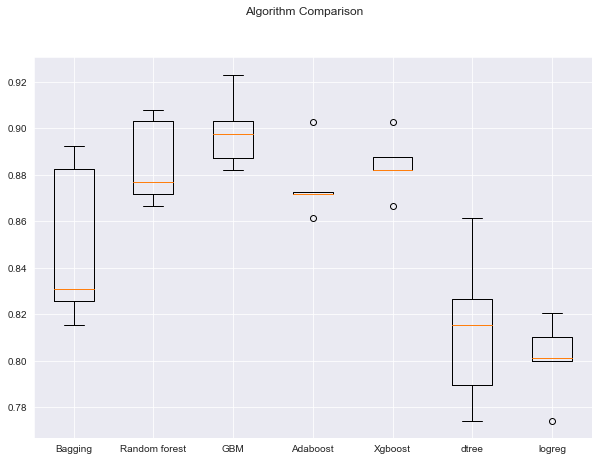

In [58]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure(figsize=(10, 7))

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results)
ax.set_xticklabels(names)

plt.show()

#### Balanced Undersampled Dataset Model training performaces (undersampled models)
- The best mean performance in the cross validation is **GradientBoostClassifier** at 89.85 for Recall.
- **GradientBoostClassifier** simply is the clear best performer in this case due to the highest mean and a relatively tight clustering of recalls from the cross validation. Therefore, ***GradientBoostClassifier will be used for further hypertuning from the undersampled models.***

### Set functions for model performance assessment

In [59]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1,
        },
        index=[0],
    )

    return df_perf

In [60]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

## Gradient Boost Classifier for base dataset

In [61]:
# Initialize base model as a Gradient Boost Classifier
base_model = GradientBoostingClassifier(random_state=rand_st)

# Examine parameters of Gradient Boost Classifier
base_model.get_params().keys()

dict_keys(['ccp_alpha', 'criterion', 'init', 'learning_rate', 'loss', 'max_depth', 'max_features', 'max_leaf_nodes', 'min_impurity_decrease', 'min_impurity_split', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'n_estimators', 'n_iter_no_change', 'random_state', 'subsample', 'tol', 'validation_fraction', 'verbose', 'warm_start'])

In [62]:
%%time

# Set parameters to assess
params = {
    'loss': ['deviance', 'exponential'],
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.5],
    'n_estimators': np.arange(50, 500, 50),
    'max_features': ['auto', 'log2'],
    'ccp_alpha': np.arange(0, 0.5, 0.01)
}

# Set model score to be assessed
scorer = metrics.make_scorer(metrics.recall_score)

# Initialize RandomSearchCV
basegbc_tuned = RandomizedSearchCV(estimator=base_model, param_distributions=params, n_iter=100, scoring=scorer, cv=5, random_state=rand_st, n_jobs=-1)

basegbc_tuned.fit(X_train, Y_train)

print(f"Best parameters are {basegbc_tuned.best_params_} with CV score={basegbc_tuned.best_score_}")
beep(sound=7)

Best parameters are {'n_estimators': 100, 'max_features': 'auto', 'loss': 'deviance', 'learning_rate': 0.01, 'ccp_alpha': 0.29} with CV score=1.0
Wall time: 3min 41s


In [63]:
# Build model with best parameters
basegbc_tuned = GradientBoostingClassifier(
    random_state=rand_st,
    n_estimators=100,
    max_features='auto',
    loss='deviance',
    learning_rate=0.01,
    ccp_alpha=0.29
)

basegbc_tuned.fit(X_train, Y_train) # Fit model to training data

GradientBoostingClassifier(ccp_alpha=0.29, learning_rate=0.01,
                           max_features='auto', random_state=1)

In [64]:
basegbc_tuned_train = model_performance_classification_sklearn(basegbc_tuned, X_train, Y_train)
print("Training Performance base GBClassifier Model:")
basegbc_tuned_train

Training Performance base GBClassifier Model:


,Accuracy,Recall,Precision,F1
0,0.84,1.00,0.84,0.91


In [65]:
basegbc_tuned_val = model_performance_classification_sklearn(basegbc_tuned, X_val, Y_val)
print("Validation Performance base GBClassifier Model:")
basegbc_tuned_val

Validation Performance base GBClassifier Model:


,Accuracy,Recall,Precision,F1
0,0.84,1.00,0.84,0.91


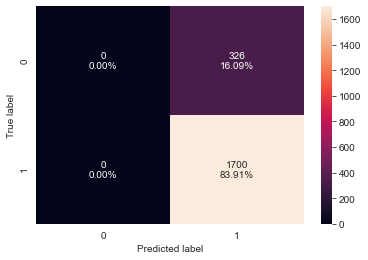

In [66]:
confusion_matrix_sklearn(basegbc_tuned, X_val, Y_val)

## XGBoost Classifier for oversampled dataset

In [67]:
# Initialize base model as a Gradient Boost Classifier
over_model = XGBClassifier(random_state=rand_st, eval_metric='logloss')

# Examine parameters of Gradient Boost Classifier
over_model.get_params().keys()

dict_keys(['objective', 'use_label_encoder', 'base_score', 'booster', 'colsample_bylevel', 'colsample_bynode', 'colsample_bytree', 'gamma', 'gpu_id', 'importance_type', 'interaction_constraints', 'learning_rate', 'max_delta_step', 'max_depth', 'min_child_weight', 'missing', 'monotone_constraints', 'n_estimators', 'n_jobs', 'num_parallel_tree', 'random_state', 'reg_alpha', 'reg_lambda', 'scale_pos_weight', 'subsample', 'tree_method', 'validate_parameters', 'verbosity', 'eval_metric'])

In [68]:
%%time

# Set parameters to assess
params = {
    'n_estimators': np.arange(50, 500, 50),
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.5],
    'gamma': [0, 1, 3, 5, 10],
    'max_depth':[3, 6, 9, 12],
    'subsample': [0, 0.5, 1],
    'lambda': [1, 3, 5]
} 

# Set model score to be assessed
scorer = metrics.make_scorer(metrics.recall_score)

# Initialize RandomSearchCV
overxgb_tuned = RandomizedSearchCV(estimator=over_model, param_distributions=params, n_iter=100, scoring=scorer, cv=5, random_state=rand_st, n_jobs=-1)

overxgb_tuned.fit(X_train_over, Y_train_over)

print(f"Best parameters are {overxgb_tuned.best_params_} with CV score={overxgb_tuned.best_score_}")
beep(sound=7)

Best parameters are {'subsample': 1, 'n_estimators': 300, 'max_depth': 6, 'learning_rate': 0.2, 'lambda': 1, 'gamma': 1} with CV score=0.9705807308202967
Wall time: 9min 32s


In [69]:
# Build model with best parameters
overxgb_tuned = XGBClassifier(
    random_state=rand_st,
    n_estimators=300,
    max_depth=6,
    learning_rate=0.2,
    gamma=1,
    eval_metric='logloss'
)

overxgb_tuned.fit(X_train_over, Y_train_over) # Fit model to training data

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='logloss',
              gamma=1, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.2, max_delta_step=0,
              max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=300, n_jobs=4,
              num_parallel_tree=1, random_state=1, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=1, tree_method='exact',
              validate_parameters=1, verbosity=None)

In [70]:
overxgb_tuned_train = model_performance_classification_sklearn(overxgb_tuned, X_train_over, Y_train_over)
print("Training Performance base GBClassifier Model:")
overxgb_tuned_train

Training Performance base GBClassifier Model:


,Accuracy,Recall,Precision,F1
0,0.99,0.99,0.99,0.99


In [71]:
overxgb_tuned_val = model_performance_classification_sklearn(overxgb_tuned, X_val, Y_val)
print("Validation Performance base GBClassifier Model:")
overxgb_tuned_val

Validation Performance base GBClassifier Model:


,Accuracy,Recall,Precision,F1
0,0.93,0.97,0.95,0.96


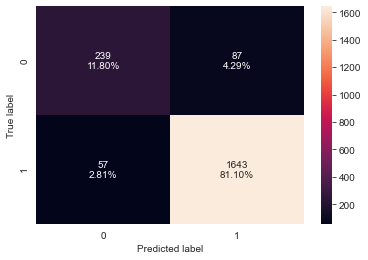

In [72]:
confusion_matrix_sklearn(overxgb_tuned, X_val, Y_val)

## Gradient Boost Classifier for undersampled dataset

In [73]:
# Initialize base model as a Gradient Boost Classifier
under_model = GradientBoostingClassifier(random_state=rand_st)

# Examine parameters of Gradient Boost Classifier
under_model.get_params().keys()

dict_keys(['ccp_alpha', 'criterion', 'init', 'learning_rate', 'loss', 'max_depth', 'max_features', 'max_leaf_nodes', 'min_impurity_decrease', 'min_impurity_split', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'n_estimators', 'n_iter_no_change', 'random_state', 'subsample', 'tol', 'validation_fraction', 'verbose', 'warm_start'])

In [74]:
%%time

# Set parameters to assess
params = {
    'loss': ['deviance', 'exponential'],
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.5],
    'n_estimators': np.arange(50, 500, 50),
    'max_features': ['auto', 'log2'],
    'max_depth': [3, 6, 9, 12],
    'ccp_alpha': np.arange(0, 0.5, 0.01)
}

# Set model score to be assessed
scorer = metrics.make_scorer(metrics.recall_score)

# Initialize RandomSearchCV
undergbc_tuned = RandomizedSearchCV(estimator=base_model, param_distributions=params, n_iter=100, scoring=scorer, cv=5, random_state=rand_st, n_jobs=-1)

undergbc_tuned.fit(X_train_under, Y_train_under)

print(f"Best parameters are {undergbc_tuned.best_params_} with CV score={undergbc_tuned.best_score_}")
beep(sound=7)

Best parameters are {'n_estimators': 450, 'max_features': 'log2', 'max_depth': 9, 'loss': 'exponential', 'learning_rate': 0.05, 'ccp_alpha': 0.0} with CV score=0.8954578754578755
Wall time: 2min 40s


In [75]:
# Build model with best parameters
undergbc_tuned = GradientBoostingClassifier(
    n_estimators=450,
    max_features='log2',
    max_depth=9,
    loss='exponential',
    learning_rate=0.05
)

undergbc_tuned.fit(X_train_under, Y_train_under) # Fit model to training data

GradientBoostingClassifier(learning_rate=0.05, loss='exponential', max_depth=9,
                           max_features='log2', n_estimators=450)

In [76]:
undergbc_tuned_train = model_performance_classification_sklearn(undergbc_tuned, X_train_under, Y_train_under)
print("Training Performance base GBClassifier Model:")
undergbc_tuned_train

Training Performance base GBClassifier Model:


,Accuracy,Recall,Precision,F1
0,1.00,1.00,1.00,1.00


In [77]:
undergbc_tuned_val = model_performance_classification_sklearn(undergbc_tuned, X_val, Y_val)
print("Validation Performance base GBClassifier Model:")
undergbc_tuned_val

Validation Performance base GBClassifier Model:


,Accuracy,Recall,Precision,F1
0,0.90,0.92,0.97,0.94


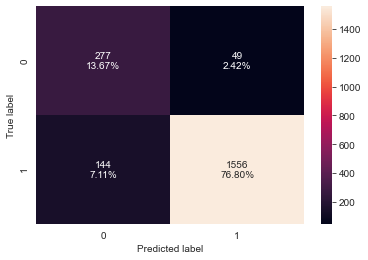

In [78]:
confusion_matrix_sklearn(undergbc_tuned, X_val, Y_val)

## Model Comparison

In [79]:
# Training performance comparison
models_train_comp_df = pd.concat(
    [
        basegbc_tuned_train.T,
        overxgb_tuned_train.T,
        undergbc_tuned_train.T
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "GBClassifier Tuned, Base Dataset",
    "XGBClassifier Tuned, Oversampled Dataset",
    "GBCClassifier Tuned Undersampled Dataset",
]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,"GBClassifier Tuned, Base Dataset","XGBClassifier Tuned, Oversampled Dataset",GBCClassifier Tuned Undersampled Dataset
Accuracy,0.84,0.99,1.00
Recall,1.00,0.99,1.00
Precision,0.84,0.99,1.00
F1,0.91,0.99,1.00


In [80]:
# Validation performance comparison
models_val_comp_df = pd.concat(
    [
        basegbc_tuned_val.T,
        overxgb_tuned_val.T,
        undergbc_tuned_val.T
    ],
    axis=1,
)
models_val_comp_df.columns = [
    "GBClassifier Tuned, Base Dataset",
    "XGBClassifier Tuned, Oversampled Dataset",
    "GBCClassifier Tuned Undersampled Dataset",
]
print("Validation performance comparison:")
models_val_comp_df

Validation performance comparison:


,"GBClassifier Tuned, Base Dataset","XGBClassifier Tuned, Oversampled Dataset",GBCClassifier Tuned Undersampled Dataset
Accuracy,0.84,0.93,0.90
Recall,1.00,0.97,0.92
Precision,0.84,0.95,0.97
F1,0.91,0.96,0.94


**The XGBoost Classifier with the oversampled dataset with SMOTE performs the best.** There is some slight overfitting, but this is true for all the models. While the Recall is not the highest, it is still a recall of 0.97 while maintaining all other metrics at 0.93 and above.

## Model Performance on Test dataset

In [81]:
# Assess performance of best model on the test dataset
overxgb_tuned_test = model_performance_classification_sklearn(overxgb_tuned, X_test, Y_test)
print("Test Performance:")
overxgb_tuned_test

Test Performance:


,Accuracy,Recall,Precision,F1
0,0.94,0.97,0.96,0.96


- The XGBoost Classifier, based on oversampled data to balance the target variable generalizes well. It retains a Recall of 0.97, while increasing slightly by 0.01 on all other metrics to 0.94 (Accuracy), 0.96 (Precision), and 0.96 (F1). **These scores are good evidence that this model is generaliable and suitable for production.**

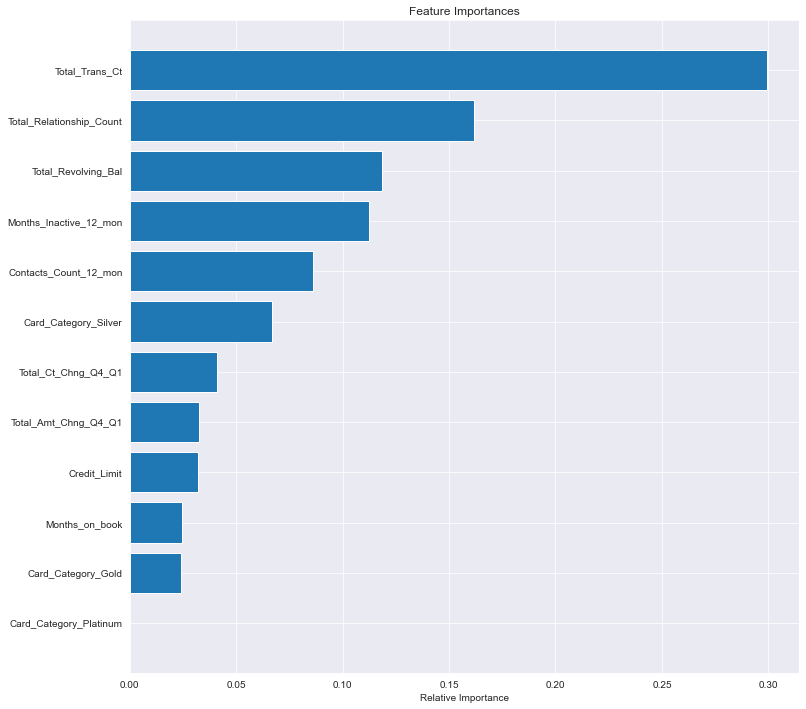

In [82]:
"""Examine feature importances"""
feature_names = X.columns
importances = overxgb_tuned.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

- **Total_Trans_Ct** is the most relevant feature. This means that the number of transactions a customer makes with their credit card is the best predictor of whether or not the remain a customer (churn or not).
- **Total_Relationship_Count** is the second most relevant feature. This means that the number of products the customer holds with the bank is a significant predictor of whether or not a customer will remain with the bank.
- **Total_Revolving_Bal** is the third most relevant feature. This means the amount of balance a customer carries from month to month on their credit card account is a significant predictor of whether or not they will remain with the bank.
- **Months_Inactive_12_mon** is the fourth most relevant feature. This means that the lenght of time a customer has been inactive is a significant predictor of whether or not the customer will remain with the bank.
- **Contacts_Count_12_mon** is the fifth most relevant feature. This means the number of contacts the bank has with the customer is a significant contributer to whether or not a customer remains with the bank.

## Pipeline for production of the model

In [83]:
# Create series of numerical and categorical data in original dataset for pipeline
num_cols = list(eda_df.select_dtypes(include=np.number).columns)
cat_cols = list(eda_df.drop(columns='Attrition_Flag').select_dtypes(exclude=np.number).columns)

# Create a transformer for the numerical variables
numeric_transformer = Pipeline(steps=[
                                    ('imputer', SimpleImputer(strategy='median'))]
                             )

# Create a transformer for the categorical variables
categorical_transformer = Pipeline(steps=[
                                    ('imputer', SimpleImputer(strategy='most_frequent')),
                                    ('onehot', OneHotEncoder(handle_unknown='ignore'))]
                                  )

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, num_cols),
        ('cat', categorical_transformer, cat_cols)
    ],
    remainder="passthrough"
)

In [84]:
# Separate Target Variable from the others
X = eda_df.drop(columns='Attrition_Flag')
Y = eda_df.Attrition_Flag

In [85]:
# Split data into train and test sets
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=1, stratify=Y)
print(X_train.shape, X_test.shape)

(7088, 19) (3039, 19)


In [86]:
# Initialize pipline with the best parameters
pipe = Pipeline(
    steps=[
        ('pre', preprocessor),
        ("XGB",
        XGBClassifier(
        random_state=1,
        n_estimators=300,
        max_depth=6,
        learning_rate=0.2,
        gamma=1,
        eval_metric='logloss'
    ))
])
# Fit model to training data
pipe.fit(X_train, Y_train)

Pipeline(steps=[('pre',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['Customer_Age',
                                                   'Dependent_count',
                                                   'Months_on_book',
                                                   'Total_Relationship_Count',
                                                   'Months_Inactive_12_mon',
                                                   'Contacts_Count_12_mon',
                                                   'Credit_Limit',
                                                   'Total_Revolving_Bal',
                                                   'Avg_Open_To_Buy',
                            

# Business Recommendations
- Encourage customers to make transactions. This could potentially be accomplished through rewards systems. Offering customers incentives to use their credit card for regular purchases such as groceries or gas is likely the best way to prevent a customer from churning.
- Encourage/incentivise customers to maintain multiple products with the bank. The more products a customer uses from Thera Bank the less likely they appear to be to churn.
- Encourage/incentivise customer to maintain a level of revolving balance. A number of customers maintain 0 as a revolving balance, however, those customer who were retained by Thera Bank tend to maintain higher revolving balances.